

## DOG VISION PROJECT

* **Project:** Dog Vision - Using computer vision to classify dog photos into different breeds.
* **Goals:** Learn TensorFlow, deep learning and transfer learning, beat the original research paper results (22% accuracy).
* **Domain:** Computer vision.
* **Data:** Images of dogs from [Stanford Dogs Dataset](http://vision.stanford.edu/aditya86/ImageNetDogs/) (120 dog breeds, 20,000+ images).
* **Problem type:** Multi-class classification (120 different classes).
* **Runtime:** This project is designed to run end-to-end in [Google Colab](https://colab.research.google.com/) (for free GPU access and easy setup). If you'd like to run it locally, it will require environment setup.
* **Demo:** See a [demo of the trained model running on Hugging Face Spaces](https://huggingface.co/spaces/mrdbourke/dog_vision).

*What we're going to build: Dog Vision 🐶👁️, a neural network capable of identifying different dog breeds in images. All the way from dataset preparation to model building, training and evaluation.*

In [1]:
# Quick timestamp
import datetime
print(f"Last updated: {datetime.datetime.now()}")

Last updated: 2025-01-06 15:50:37.516020


## What we're going to cover

In this project, we’ll explore the power of deep learning, with a particular focus on transfer learning using TensorFlow and Keras.

We’ll approach this using the 6-step machine learning framework:

1. Problem Definition--Classify images of dogs into their respective breeds using computer vision.
2. Data--Work with over 20,000 images spanning 120 dog breeds from the Stanford Dogs dataset.
3. Evaluation--Aim to surpass the original paper's results (22% mean accuracy across all classes).
4. Features--Leverage deep learning to let the model automatically learn features from the data.
5. Modeling--Utilize a pretrained convolutional neural network (CNN) and apply transfer learning techniques.
6. Experiments--Conduct experiments to analyze how varying amounts of data impact the model’s performance.




## Table of contents

1. Getting Setup
2. Getting Data (dog images and their breeds)
3. Exploring the data (exploratory data analysis)
4. Creating training and test splits
5. Turning our datasets into TensorFlow Dataset(s)
6. Creating a neural network with TensorFlow
7. Model 0 - Train a model on 10% of the training data
8. Putting it all together: create, compile, fit
9. Model 1 - Train a model on 100% of the training data
10. Make and evaluate predictions of the best model
11. Save and load the best model
12. Make predictions on custom images with the best model (bringing Dog Vision 🐶👁️ to life!)
13. Key takeaways
14. Extensions & exercises

## 1. Getting setup

This notebook is designed to run in [Google Colab](https://colab.research.google.com/), an online Jupyter Notebook that provides free access to GPUs (Graphics Processing Units, we'll hear more on these later).



### Getting a GPU on Google Colab

Before running any code, we'll make sure our Google Colab instance is connected to a GPU.



In [3]:
## I dowloaded 2.15 TENSORFLOW because of Sequential
%pip install tensorflow==2.15.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 66.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 52.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 109.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.1 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.0
    Uninstalling wrapt-1.17.0:
      Successfully uninstalled wrapt-1.17.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Successfully uninstalled keras-3.5.0
  Attempting uninstall: tensorboard
    Found existing installatio

In [2]:
import tensorflow as tf
tf.__version__

'2.15.0'

Now let's check to see if TensorFlow has access to a GPU (this isn't 100% required to complete this project but will speed things up dramatically).



In [3]:
# Do we have access to a GPU?
device_list = tf.config.list_physical_devices()
if "GPU" in [device.device_type for device in device_list]:
  print(f"[INFO] TensorFlow has GPU available to use. Woohoo!! Computing will be sped up!")
  print(f"[INFO] Accessible devices:\n{device_list}")
else:
  print(f"[INFO] TensorFlow does not have GPU available to use. Models may take a while to train.")
  print(f"[INFO] Accessible devices:\n{device_list}")

[INFO] TensorFlow has GPU available to use. Woohoo!! Computing will be sped up!
[INFO] Accessible devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## 2. Getting Data


There are several options and locations to get data for a deep learning project.

| Resource | Description |
| :----- | :----- |
| [Kaggle Datasets](https://www.kaggle.com/datasets) | A collection of datasets across a wide range of topics. |
| [TensorFlow Datasets](https://www.tensorflow.org/datasets) | A collection of ready-to-use machine learning datasets ready for use under the `tf.data.Datasets` API. You can see a list of [all available datasets](https://www.tensorflow.org/datasets/catalog/overview#all_datasets) in the TensorFlow documentation. |
| [Hugging Face Datasets](https://huggingface.co/datasets) | A continually growing resource of datasets broken into several different kinds of topics. |
| [Google Dataset Search](https://datasetsearch.research.google.com/) | A search engine by Google specifically focused on searching online datasets. |
| Original sources | Datasets which are made available by researchers or companies with the release of a product or research paper (sources for these will vary, they could be a link on a website or a link to an application form). |
| Custom datasets | These are datasets comprised of your own custom source of data. You may build these from scratch on your own or have access to them from an existing product or service. For example, your entire photos library could be your own custom dataset or your entire notes and documents folder or your company's customer order history. |

In our case, the dataset we're going to use is called the Stanford Dogs dataset (or ImageNet dogs, as the images are dogs separated from ImageNet).

Because the Stanford Dogs dataset has been around for a while (since 2011, which as of writing this in 2024 is like a lifetime in deep learning), it's available from several resources:

* The [original project website](http://vision.stanford.edu/aditya86/ImageNetDogs/) via link download.
* Inside [TensorFlow datasets under `stanford_dogs`](https://www.tensorflow.org/datasets/catalog/stanford_dogs).
* On [Kaggle as a downloadable dataset](https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset).


As we explore deep learning projects, it’s clear that there’s no shortage of publicly available datasets to start with.

However, when we move toward building our own projects or working within a company, we’ll often deal with custom datasets—data that we create or that isn’t publicly accessible. Unlike existing datasets, which are usually preformatted and ready to use, custom datasets often require preprocessing to make them suitable for machine learning tasks.

To practice dataset formatting, we’ll download the Stanford Dogs dataset from its original website.

### Download data directly from Stanford Dogs website

Our overall project goal is to build a computer vision model which performs better than the original Stanford Dogs paper (average of 22% accuracy per class across 120 classes).

To do so, we need some data.

Let's download the original Stanford Dogs dataset from the project website.

The data comes in three main files:

1. [Images](http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar) (757MB) - `images.tar`
3. [Annotations](http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar) (21MB) - `annotation.tar`
3. [Lists](http://vision.stanford.edu/aditya86/ImageNetDogs/lists.tar) with train/test splits (0.5MB) - `lists.tar`

Our goal is to get a file structure like this:

<img src="https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/images/unstructured-data-dog-vision-file-structure.png?raw=true" width=600 alt="dog vision data file structure with images.tar, annotation.tar and lists.tar"/>



In [4]:
from pathlib import Path
from google.colab import drive

# 1. Mount Google Drive (this will bring up a pop-up to sign-in/authenticate)
# Note: This step is specifically for Google Colab, if you're working locally, you may need a different setup
drive.mount("/content/drive")

Mounted at /content/drive


In [6]:
# 2. Setup constants
# Note: For constants like this, you'll often see them created as variables with all capitals
TARGET_DRIVE_PATH = Path("drive/MyDrive/tensorflow/dog_vision_data")
TARGET_FILES = ["images.tar", "annotation.tar", "lists.tar"]
TARGET_URL = "http://vision.stanford.edu/aditya86/ImageNetDogs"


In [7]:
# 3. Setup local path
local_dir = Path("dog_vision_data")

# 4. Check if the target files exist in Google Drive, if so, copy them to Google Colab
if all((TARGET_DRIVE_PATH / file).is_file() for file in TARGET_FILES):
  print(f"[INFO] Copying Dog Vision files from Google Drive to local directory...")
  print(f"[INFO] Source dir: {TARGET_DRIVE_PATH} -> Target dir: {local_dir}")
  !cp -r {TARGET_DRIVE_PATH} .
  print("[INFO] Good to go!")

else:
  # 5. If the files don't exist in Google Drive, download them
  print(f"[INFO] Target files not found in Google Drive.")
  print(f"[INFO] Downloading the target files... this shouldn't take too long...")
  for file in TARGET_FILES:
    # wget is short for "world wide web get", as in "get a file from the web"
    # -nc or --no-clobber = don't download files that already exist locally
    # -P = save the target file to a specified prefix, in our case, local_dir
    !wget -nc {TARGET_URL}/{file} -P {local_dir} # the "!" means to execute the command on the command line rather than in Python

  print(f"[INFO] Saving the target files to Google Drive, so they can be loaded later...")

  # 6. Ensure target directory in Google Drive exists
  TARGET_DRIVE_PATH.mkdir(parents=True, exist_ok=True)

  # 7. Copy downloaded files to Google Drive (so we can use them later and not have to re-download them)
  !cp -r {local_dir}/* {TARGET_DRIVE_PATH}/

[INFO] Target files not found in Google Drive.
[INFO] Downloading the target files... this shouldn't take too long...
--2025-01-06 16:02:34--  http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 793579520 (757M) [application/x-tar]
Saving to: ‘dog_vision_data/images.tar’

images.tar          100%[===================>] 756.82M  3.69MB/s    in 3m 37s  

2025-01-06 16:06:12 (3.49 MB/s) - ‘dog_vision_data/images.tar’ saved [793579520/793579520]

--2025-01-06 16:06:12--  http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21852160 (21M) [application/x-tar]
Sa


We can first make sure it exists with [`Path.exists()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.exists) and then we can iterate through its contents with [`Path.iterdir()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.iterdir) and print out the [`.name`](https://docs.python.org/3/library/pathlib.html#pathlib.PurePath.name) attribute of each file.

In [8]:
if local_dir.exists():
  print(str(local_dir) + "/")
  for item in local_dir.iterdir():
    print("  ", item.name)

dog_vision_data/
   lists.tar
   images.tar
   annotation.tar




We can use the [`!tar`](https://www.gnu.org/software/tar/manual/tar.html) command (or just `tar` from outside of a Jupyter Cell) to handle archive files.

By doing this, we’ll expand all of the files contained within each .tar archive.

We'll also use a couple of flags to help us out:
* The `-x` flag tells `tar` to extract files from an archive.
* The `-f` flag specifies that the following argument is the name of the archive file.
* We can combine flags by putting them together `-xf`




In [9]:
# Untar images, notes/tags:
# -x = extract files from the zipped file
# -v = verbose
# -z = decompress files
# -f = tell tar which file to deal with
!tar -xf dog_vision_data/images.tar
!tar -xf dog_vision_data/annotation.tar
!tar -xf dog_vision_data/lists.tar

In [10]:
import os

os.listdir(".") # "." stands for "here" or "current directory"

['.config',
 'train_list.mat',
 'file_list.mat',
 'dog_vision_data',
 'Images',
 'test_list.mat',
 'Annotation',
 'drive',
 'sample_data']



We have now new files.

Specifically:

* `train_list.mat` - a list of all the training set images.
* `test_list.mat` - a list of all the testing set images.
* `Images/` - a folder containing all of the images of dogs.
* `Annotation/` - a folder containing all of the annotations for each image.
* `file_list.mat` - a list of all the files (training and test list combined).

Our next step is to go through them and see what we've got.



## 3. Exploring the data

Once you've got a dataset, before building a model, it's wise to explore it for a bit to see what kind of data you're working with.

Exploring a dataset involves:

* Viewing random samples: Look at 100+ samples to get a sense of the data.
* Visualizing often: Charts, images, or summaries help us understand the dataset better.
* Checking statistics: Examine distributions, class counts, or use clustering if labels are missing.



### Our target data format

Since our goal is to build a computer vision model to classify dog breeds, we need a way to tell our model what breed of dog is in what image.

A common data format for a classification problem is to have samples stored in folders named after their class name.

For example:

<img src="https://github.com/mrdbourke/zero-to-mastery-ml/blob/master/images/unstructured-data-image-folder-structure.png?raw=true" width=600 alt="example directory structure of images for an image classification problem"/>

In the case of dog images, we'd put all of the images labelled "chihuahua" in a folder called `chihuahua/` (and so on for all the other classes and images).

We could split these folders so that training images go in `train/chihuahua/` and testing images go in `test/chihuahua/`.

This is what we'll be working towards creating.



### Exploring the file lists

How about we check out the `train_list.mat`, `test_list.mat` and `full_list.mat` files?



We can use the [`scipy.io.loadmat()`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.loadmat.html) method to open a `.mat` file.

In [11]:
import scipy

# Open lists of train and test .mat
train_list = scipy.io.loadmat("train_list.mat")
test_list = scipy.io.loadmat("test_list.mat")
file_list = scipy.io.loadmat("file_list.mat")

# Let's inspect the output and type of the train_list
train_list, type(train_list)

({'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sun Oct  9 08:36:13 2011',
  '__version__': '1.0',
  '__globals__': [],
  'file_list': array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
        dtype=object),
  'annotation_list': array([[array(['n02085620-Chihuahua/n02085620_5927'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_4441'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_1502'], dtype='<U34')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_6754'], dtype=

In [12]:
train_list.keys()

dict_keys(['__header__', '__version__', '__globals__', 'file_list', 'annotation_list', 'labels'])

In [13]:
# Check the length of the file_list key
print(f"Number of files in training list: {len(train_list['file_list'])}")
print(f"Number of files in testing list: {len(test_list['file_list'])}")
print(f"Number of files in full list: {len(file_list['file_list'])}")

Number of files in training list: 12000
Number of files in testing list: 8580
Number of files in full list: 20580




Let's inspect the `train_list['file_list']` further.

In [14]:
train_list['file_list']

array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
       ...,
       [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
      dtype=object)

In [15]:
# Get a single filename
train_list['file_list'][0][0][0]

'n02085620-Chihuahua/n02085620_5927.jpg'

Now let's get a Python list of all the individual file names (e.g. `n02097130-giant_schnauzer/n02097130_2866.jpg`) so we can use them later.

In [16]:
# Get a Python list of all file names for each list
train_file_list = list([item[0][0] for item in train_list["file_list"]])
test_file_list = list([item[0][0] for item in test_list["file_list"]])
full_file_list = list([item[0][0] for item in file_list["file_list"]])

len(train_file_list), len(test_file_list), len(full_file_list)

(12000, 8580, 20580)



Let's check  a random sample of the filenames we extracted?

We can view random samples of the data using Python's [`random.sample()`](https://docs.python.org/3/library/random.html#random.sample) method.

In [17]:
import random

random.sample(train_file_list, k=10)

['n02102177-Welsh_springer_spaniel/n02102177_2910.jpg',
 'n02090379-redbone/n02090379_5200.jpg',
 'n02112137-chow/n02112137_1401.jpg',
 'n02090721-Irish_wolfhound/n02090721_2267.jpg',
 'n02106166-Border_collie/n02106166_470.jpg',
 'n02090379-redbone/n02090379_5483.jpg',
 'n02088094-Afghan_hound/n02088094_60.jpg',
 'n02113023-Pembroke/n02113023_827.jpg',
 'n02089078-black-and-tan_coonhound/n02089078_3038.jpg',
 'n02115913-dhole/n02115913_4336.jpg']

Now let's do a quick check to make sure none of the training image file names appear in the testing image file names list.

This is important because the number 1 rule in machine learning is: **always keep the test set separate from the training set**.

We can check that there are no overlaps by turning `train_file_list` into a Python [`set()`](https://docs.python.org/3/library/stdtypes.html#set-types-set-frozenset) and using the [`intersection()`](https://docs.python.org/3/library/stdtypes.html#frozenset.intersection) method.

In [18]:
# How many files in the training set intersect with the testing set?
len(set(train_file_list).intersection(test_file_list))

0

There is no overlaps

We could even put an [`assert`](https://docs.python.org/3/reference/simple_stmts.html#the-assert-statement) check to raise an error if there are any overlaps (e.g. the length of the intersection is greater than 0).

`assert` works in the fashion: `assert expression, message_if_expression_fails`.

If the `assert` check doesn't output anything, we're good to go!

In [19]:
# Make an assertion statement to check there are no overlaps (try changing test_file_list to train_file_list to see how it works)
assert len(set(train_file_list).intersection(test_file_list)) == 0, "There are overlaps between the training and test set files, please check them."

Woohoo!

Looks like there's no overlaps, let's keep exploring the data.

### Exploring the Annotation folder

How about we look at the `Annotation` folder next?

We can click the folder on the file explorer on the left to see what's inside.

But we can also explore the contents of the folder with Python.

Let's use [`os.listdir()`](https://docs.python.org/3/library/os.html#os.listdir) to see what's inside.

In [20]:
os.listdir("Annotation")[:10]

['n02086646-Blenheim_spaniel',
 'n02092339-Weimaraner',
 'n02097298-Scotch_terrier',
 'n02094114-Norfolk_terrier',
 'n02100236-German_short-haired_pointer',
 'n02098286-West_Highland_white_terrier',
 'n02101556-clumber',
 'n02097209-standard_schnauzer',
 'n02090721-Irish_wolfhound',
 'n02105855-Shetland_sheepdog']

Looks like there are files each with a dog breed name with several numbered files inside.

Each of the files contains a HTML version of an annotation relating to an image.

For example, `Annotation/n02085620-Chihuahua/n02085620_10074`:

```html
<annotation>
	<folder>02085620</folder>
	<filename>n02085620_10074</filename>
	<source>
		<database>ImageNet database</database>
	</source>
	<size>
		<width>333</width>
		<height>500</height>
		<depth>3</depth>
	</size>
	<segment>0</segment>
	<object>
		<name>Chihuahua</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>25</xmin>
			<ymin>10</ymin>
			<xmax>276</xmax>
			<ymax>498</ymax>
		</bndbox>
	</object>
</annotation>
```

The fields include the name of the image, the size of the image, the label of the object and where it is (bounding box coordinates).

If we were performing [object detection](https://en.wikipedia.org/wiki/Object_detection) (finding the location of a thing in an image), we'd pay attention to the `<bndbox>` coordinates.

However, since we're focused on classification, our main consideration is the mapping of image name to class name.

Since we're dealing with 120 classes of dog breed, let's write a function to check the number of subfolders in the `Annotation` directory (there should be 120 subfolders, one for each breed of dog).

To do so, we can use Python's [`pathlib.Path` class](https://docs.python.org/3/library/pathlib.html#basic-use), along with [`Path.iterdir()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.iterdir) to loop over the contents of `Annotation` and [`Path.is_dir()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.is_dir) to check if the target item is a directory.

In [21]:
from pathlib import Path

def count_subfolders(directory_path: str) -> int:
    """
    Count the number of subfolders in a given directory.

    Args:
    directory_path (str): The path to the directory in which to count subfolders.

    Returns:
    int: The number of subfolders in the specified directory.

    Examples:
    >>> count_subfolders('/path/to/directory')
    3  # if there are 3 subfolders in the specified directory
    """
    return len([name for name in Path(directory_path).iterdir() if name.is_dir()])


directory_path = "Annotation"
folder_count = count_subfolders(directory_path)
print(f"Number of subfolders in {directory_path} directory: {folder_count}")

Number of subfolders in Annotation directory: 120




It seems that , there are 120 subfolders of annotations, one for each class of dog we'd like to identify.

But on further inspection of our file lists, it looks like the class name is already in the filepath.

In [22]:
# View a single training file pathname
train_file_list[0]

'n02085620-Chihuahua/n02085620_5927.jpg'

With this information we know, that image `n02085620_5927.jpg` should contain a `Chihuahua`.

Let's check.



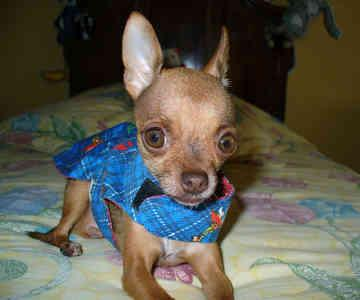

In [23]:
from IPython.display import Image
Image(Path("Images", train_file_list[0]))

### Exploring the Images folder

We've explored the `Annotations` folder, now let's check out our `Images` folder.

We know that the image file names come in the format `class_name/image_name`, for example, `n02085620-Chihuahua/n02085620_5927.jpg`.

To make things a little simpler, let's create the following:

1. A mapping from folder name -> class name in dictionary form, for example, `{'n02113712-miniature_poodle': 'miniature_poodle',
 'n02092339-Weimaraner': 'weimaraner',
 'n02093991-Irish_terrier': 'irish_terrier'...}`. This will help us when visualizing our data from its original folder.
2. A list of all unique dog class names with simple formatting, for example, `['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier'...]`.

 Let's start by getting a list of all the folders in the `Images` directory with `os.listdir()`.

In [24]:
# Get a list of all image folders
image_folders = os.listdir("Images")
image_folders[:10]

['n02086646-Blenheim_spaniel',
 'n02092339-Weimaraner',
 'n02097298-Scotch_terrier',
 'n02094114-Norfolk_terrier',
 'n02100236-German_short-haired_pointer',
 'n02098286-West_Highland_white_terrier',
 'n02101556-clumber',
 'n02097209-standard_schnauzer',
 'n02090721-Irish_wolfhound',
 'n02105855-Shetland_sheepdog']



Now let's make a dictionary which maps from the folder name to a simplified version of the class name, for example:

```
{'n02085782-Japanese_spaniel': 'japanese_spaniel',
'n02106662-German_shepherd': 'german_shepherd',
'n02093256-Staffordshire_bullterrier': 'staffordshire_bullterrier',
...}
```


In [25]:
# Create folder name -> class name dict
folder_to_class_name_dict = {}
for folder_name in image_folders:
  # Turn folder name into class_name
  # E.g. "n02089078-black-and-tan_coonhound" -> "black_and_tan_coonhound"
  # We'll split on the first "-" and join the rest of the string with "_" and then lower it
  class_name = "_".join(folder_name.split("-")[1:]).lower()
  folder_to_class_name_dict[folder_name] = class_name

# Make sure there are 120 entries in the dictionary
assert len(folder_to_class_name_dict) == 120

Folder name to class name mapping created, let's view the first 10.

In [26]:
list(folder_to_class_name_dict.items())[:10]

[('n02086646-Blenheim_spaniel', 'blenheim_spaniel'),
 ('n02092339-Weimaraner', 'weimaraner'),
 ('n02097298-Scotch_terrier', 'scotch_terrier'),
 ('n02094114-Norfolk_terrier', 'norfolk_terrier'),
 ('n02100236-German_short-haired_pointer', 'german_short_haired_pointer'),
 ('n02098286-West_Highland_white_terrier', 'west_highland_white_terrier'),
 ('n02101556-clumber', 'clumber'),
 ('n02097209-standard_schnauzer', 'standard_schnauzer'),
 ('n02090721-Irish_wolfhound', 'irish_wolfhound'),
 ('n02105855-Shetland_sheepdog', 'shetland_sheepdog')]

And we can get a list of unique dog names by getting the `values()` of the `folder_to_class_name_dict` and turning it into a list.

In [27]:
dog_names = sorted(list(folder_to_class_name_dict.values()))
dog_names[:10]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle']



Now we've got:

1. `folder_to_class_name_dict` - a mapping from the folder name to the class name.
2. `dog_names` - a list of all the unique dog breeds we're working with.



### Visualize a group of random images

To help us visualize, let's create a function that takes in a list of image paths and then randomly selects 10 of those paths to display.

The function will:
1. Take in a select list of image paths.
2. Create a grid of matplotlib plots (e.g. 2x5 = 10 plots to plot on).
3. Randomly sample 10 image paths from the input image path list (using `random.sample()`).
4. Iterate through the flattened axes via `axes.flat` which is a reference to the attribute [`numpy.ndarray.flat`](https://numpy.org/doc/stable/reference/generated/numpy.ndarray.flat.html).
5. Extract the sample path from the list of samples.
6. Get the sample title from the parent folder of the path using [`Path.parent.stem`](https://docs.python.org/3/library/pathlib.html#pathlib.PurePath.parent) and then extract the formatted dog breed name by indexing `folder_to_class_name_dict`.
7. Read the image with [`plt.imread()`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imread.html) and show it on the target `ax` with [`ax.imshow()`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html).
8. Set the title of the plot to the parent folder name with [`ax.set_title()`](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.set_title.html) and turn the axis marks of with [`ax.axis("off")`](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.axis.html) (this makes for pretty plots).
9. Show the plot with `plt.show()`.


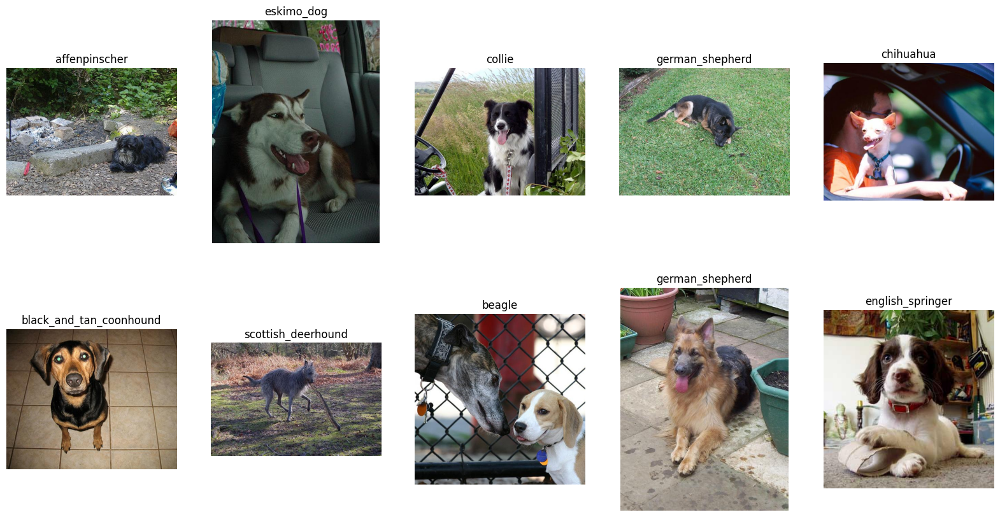

In [28]:
import random

from pathlib import Path
from typing import List

import matplotlib.pyplot as plt

# 1. Take in a select list of image paths
def plot_10_random_images_from_path_list(path_list: List[Path],
                                         extract_title: bool=True) -> None:
  # 2. Set up a grid of plots
  fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))

  # 3. Randomly sample 10 paths from the list
  samples = random.sample(path_list, 10)

  # 4. Iterate through the flattened axes and corresponding sample paths
  for i, ax in enumerate(axes.flat):

    # 5. Get the target sample path (e.g. "Images/n02087394-Rhodesian_ridgeback/n02087394_1161.jpg")
    sample_path = samples[i]

    # 6. Extract the parent directory name to use as the title (if necessary)
    # (e.g. n02087394-Rhodesian_ridgeback/n02087394_1161.jpg -> n02087394-Rhodesian_ridgeback -> rhodesian_ridgeback)
    if extract_title:
      sample_title = folder_to_class_name_dict[sample_path.parent.stem]
    else:
      sample_title = sample_path.parent.stem

    # 7. Read the image file and plot it on the corresponding axis
    ax.imshow(plt.imread(sample_path))

    # 8. Set the title of the axis and turn of the axis (for pretty plots)
    ax.set_title(sample_title)
    ax.axis("off")

  # 9. Display the plot
  plt.show()

plot_10_random_images_from_path_list(path_list=[Path("Images") / Path(file) for file in train_file_list])

### Exploring the distribution of our data

After visualization, another valuable way to explore the data is by checking the data distribution.

Distribution refers to the "spread" of data.

In our case, how many images of dogs do we have per breed?

A balanced distribution would mean having roughly the same number of images for each breed (e.g. 100 images per dog breed).

> **Note:** There's a deeper level of distribution than just images per dog breed. Ideally, the images for each different breed are well distributed as well. For example, we wouldn't want to have 100 of the same image per dog breed. Not only would we like a similar number of images per breed, we'd like the images of each particular breed to be in different scenarios, different lighting, different angles. We want this because we want to our model to be able to recognize the correct dog breed no matter what angle the photo is taken from.

To figure out how many images we have per class, let's write a function count the number of images per subfolder in a given directory.

Specifically, we'll want the function to:
1. Take in a target directory/folder.
2. Create a list of all the subdirectories/subfolders in the target folder.
3. Create an empty list, `image_class_counts` to append subfolders and their counts to.
4. Iterate through all of the subdirectories.
5. Get the class name of the target folder as the name of the folder.
6. Count the number of images in the target folder using the length of the list of image paths (we can get these with [`Path().rglob(*.jpg)`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.rglob) where `*.jpg` means "all files with the extension `.jpg`.
7. Append a dictionary of `{"class_name": class_name, "image_count": image_count}` to the `image_class_counts` list (we create a list of dictionaries so we can turn this into a pandas DataFrame).
8. Return the `image_class_counts` list.

In [29]:
# Create a dictionary of image counts
from pathlib import Path
from typing import List, Dict

# 1. Take in a target directory
def count_images_in_subdirs(target_directory: str) -> List[Dict[str, int]]:
    """
    Counts the number of JPEG images in each subdirectory of the given directory.

    Each subdirectory is assumed to represent a class, and the function counts
    the number of '.jpg' files within each one. The result is a list of
    dictionaries with the class name and corresponding image count.

    Args:
        target_directory (str): The path to the directory containing subdirectories.

    Returns:
        List[Dict[str, int]]: A list of dictionaries with 'class_name' and 'image_count' for each subdirectory.

    Examples:
        >>> count_images_in_subdirs('/path/to/directory')
        [{'class_name': 'beagle', 'image_count': 50}, {'class_name': 'poodle', 'image_count': 60}]
    """
    # 2. Create a list of all the subdirectoires in the target directory (these contain our images)
    images_dir = Path(target_directory)
    image_class_dirs = [directory for directory in images_dir.iterdir() if directory.is_dir()]

    # 3. Create an empty list to append image counts to
    image_class_counts = []

    # 4. Iterate through all of the subdirectories
    for image_class_dir in image_class_dirs:

        # 5. Get the class name from image directory (e.g. "Images/n02116738-African_hunting_dog" -> "n02116738-African_hunting_dog")
        class_name = image_class_dir.stem

        # 6. Count the number of images in the target subdirectory
        image_count = len(list(image_class_dir.rglob("*.jpg")))  # get length all files with .jpg file extension

        # 7. Append a dictionary of class name and image count to count list
        image_class_counts.append({"class_name": class_name,
                                   "image_count": image_count})

    # 8. Return the list
    return image_class_counts



Let's run it on our target directory `Images` and view the first few indexes.

In [30]:
image_class_counts = count_images_in_subdirs("Images")
image_class_counts[:3]

[{'class_name': 'n02086646-Blenheim_spaniel', 'image_count': 188},
 {'class_name': 'n02092339-Weimaraner', 'image_count': 160},
 {'class_name': 'n02097298-Scotch_terrier', 'image_count': 158}]



Since our `image_class_counts` variable is the form of a list of dictionaries, we can turn it into a pandas `DataFrame`.

Let's sort the `DataFrame` by `"image_count"` so the classes with the most images appear at the top, we can do so with [`DataFrame.sort_values()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html).

In [31]:
# Create a DataFrame
import pandas as pd
image_counts_df = pd.DataFrame(image_class_counts).sort_values(by="image_count", ascending=False)
image_counts_df.head()

,class_name,image_count
63,n02085936-Maltese_dog,252
105,n02088094-Afghan_hound,239
11,n02092002-Scottish_deerhound,232
75,n02112018-Pomeranian,219
8,n02090721-Irish_wolfhound,218


And let's cleanup the `"class_name"` column to be more readable by mapping the the values to our `folder_to_class_name_dict`.

In [32]:
# Make class name column easier to read
image_counts_df["class_name"] = image_counts_df["class_name"].map(folder_to_class_name_dict)
image_counts_df.head()

,class_name,image_count
63,maltese_dog,252
105,afghan_hound,239
11,scottish_deerhound,232
75,pomeranian,219
8,irish_wolfhound,218


Now we've got a `DataFrame` of image counts per class, we can make them more visual by turning them into a plot.

To do so, we can use `image_counts_df.plot(kind="bar", ...)` along with some other customization.

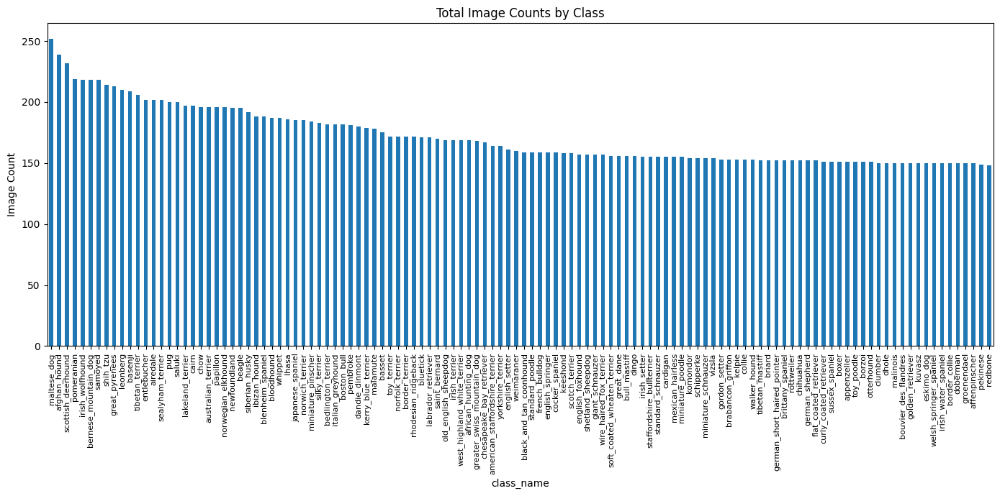

In [33]:
# Turn the image counts DataFrame into a graph
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 7))
image_counts_df.plot(kind="bar",
                     x="class_name",
                     y="image_count",
                     legend=False,
                     ax=plt.gca()) # plt.gca() = "get current axis", get the plt we setup above and put the data there

# Add customization
plt.ylabel("Image Count")
plt.title("Total Image Counts by Class")
plt.xticks(rotation=90, # Rotate the x labels for better visibility
           fontsize=8) # Make the font size smaller for easier reading
plt.tight_layout() # Ensure things fit nicely
plt.show()

 It looks like our classes are quite balanced. Each breed of dog has ~150 or more images.

We can find out some other quick stats about our data with [`DataFrame.describe()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html).

In [34]:
# Get various statistics about our data distribution
image_counts_df.describe()

,image_count
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


And the table shows a similar story to the plot. We can see the minimum number of images per class is 148, where as the maximum number of images is 252.

If one class had 10x less images than another class, we may look into collecting more data to improve the balance.

The main takeaway(s):
* When working on a classification problem, ideally, all classes have a similar number of samples (however, in some problems this may be unattainable, such as fraud detection, where you may have 1000x more "not fraud" samples to "fraud" samples.
* If you wanted to add a new class of dog breed to the existing 120, ideally, you'd have at least ~150 images for it (though as we'll see with transfer learning, the number of required images could be less as long as they're high quality).

## 4. Creating training and test data split directories

After exploring the data, one of the next best things we can do is create experimental data splits.

This includes:

| Set Name | Description | Typical Percentage of Data |
|:-----|:-----|:-----|
| Training Set | A dataset for the model to learn on | 70-80% |
| Testing Set              | A dataset for the model to be evaluated on           | 20-30%                    |
| (Optional) Validation Set | A dataset to tune the model on                       | 50% of the test data      |
| (Optional) Smaller Training Set | A smaller size dataset to run quick experiments on | 5-20% of the training set |

Our dog dataset already comes with specified training and test set splits.

So we'll stick with those.

But we'll also create a smaller training set (a random 10% of the training data) so we can stick to the machine learning engineers motto of *experiment, experiment, experiment!* and run quicker experiments.

> **Note:** One of the most important things in machine learning is being able to experiment quickly. As in, try a new model, try a new set of hyperparameters or try a new training setup. When you start out, you want the time between your experiments to be as small as possible so you can quickly figure out what *doesn't work* so you can spend more time on and run larger experiments with what *does* work.

As previously discussed, we're working towards a directory structure of:

```
images_split/
├── train/
│   ├── class_1/
│   │   ├── train_image1.jpg
│   │   ├── train_image2.jpg
│   │   └── ...
│   ├── class_2/
│   │   ├── train_image1.jpg
│   │   ├── train_image2.jpg
│   │   └── ...
└── test/
    ├── class_1/
    │   ├── test_image1.jpg
    │   ├── test_image2.jpg
    │   └── ...
    ├── class_2/
    │   ├── test_image1.jpg
    │   ├── test_image2.jpg
...
```

So let's write some code to create:
* `images/train/` directory to hold all of the training images.
* `images/test/` directory to hold all of the testing images.
* Make a directory inside each of `images/train/` and `images/test/` for each of the dog breed classes.

We can make each of the directories we need using [`Path.mkdir()`](https://docs.python.org/3/library/pathlib.html#pathlib.Path.mkdir).

For the dog breed directories, we'll loop through the list of `dog_names` and create a folder for each inside the `images/train/` and `images/test/` directories.


In [35]:
from pathlib import Path

# Define the target directory for image splits to go
images_split_dir = Path("images_split")

# Define the training and test directories
train_dir = images_split_dir / "train"
test_dir = images_split_dir / "test"

# Using Path.mkdir with exist_ok=True ensures the directory is created only if it doesn't exist
train_dir.mkdir(parents=True, exist_ok=True)
test_dir.mkdir(parents=True, exist_ok=True)
print(f"Directory {train_dir} is exists.")
print(f"Directory {test_dir} is exists.")

# Make a folder for each dog name
for dog_name in dog_names:
  # Make training dir folder
  train_class_dir = train_dir / dog_name
  train_class_dir.mkdir(parents=True, exist_ok=True)
  # print(f"Making directory: {train_class_dir}")

  # Make testing dir folder
  test_class_dir = test_dir / dog_name
  test_class_dir.mkdir(parents=True, exist_ok=True)
  # print(f"Making directory: {test_class_dir}")

# Make sure there is 120 subfolders in each
assert count_subfolders(train_dir) == len(dog_names)
assert count_subfolders(test_dir) == len(dog_names)

Directory images_split/train is exists.
Directory images_split/test is exists.


In [36]:
# See the first 10 directories in the training split dir
sorted([str(dir_name) for dir_name in train_dir.iterdir() if dir_name.is_dir()])[:10]

['images_split/train/affenpinscher',
 'images_split/train/afghan_hound',
 'images_split/train/african_hunting_dog',
 'images_split/train/airedale',
 'images_split/train/american_staffordshire_terrier',
 'images_split/train/appenzeller',
 'images_split/train/australian_terrier',
 'images_split/train/basenji',
 'images_split/train/basset',
 'images_split/train/beagle']


Let's change that by getting some images in there.

To do so, we'll create a function called `copy_files_to_target_dir()` which will copy images from the `Images` directory into their respective directories inside `images/train` and `images/test`.

More specifically, it will:
1. Take in a list of source files to copy (e.g. `train_file_list`) and a target directory to copy files to.
2. Iterate through the list of sources files to copy (we'll use [`tqdm`](https://github.com/tqdm/tqdm) which comes installed with Google Colab to create a progress bar of how many files have been copied).
3. Convert the source file path to a `Path` object.
4. Split the source file path and create a `Path` object for the destination folder (e.g. "n02112018-Pomeranian" -> "pomeranian").
5. Get the target file name (e.g. "n02112018-Pomeranian/n02112018_6208.jpg" -> "n02112018_6208.jpg").
5. Create a destination path for the source file to be copied to (e.g. `images_split/train/pomeranian/n02112018_6208.jpg`).
6. Ensure the destination directory exists, similar to the step we took in the previous section (you can't copy files to a directory that doesn't exist).
7. Print out the progress of copying (if necessary).
8. Copy the source file to the destination using Python's [`shutil.copy2(src, dst)`](https://docs.python.org/3/library/shutil.html#shutil.copy2).

In [37]:
from pathlib import Path
from shutil import copy2
from tqdm.auto import tqdm

# 1. Take in a list of source files to copy and a target directory
def copy_files_to_target_dir(file_list: list[str],
                             target_dir: str,
                             images_dir: str = "Images",
                             verbose: bool = False) -> None:
    """
    Copies a list of files from the images directory to a target directory.

    Parameters:
    file_list (list[str]): A list of file paths to copy.
    target_dir (str): The destination directory path where files will be copied.
    images_dir (str, optional): The directory path where the images are currently stored. Defaults to 'Images'.
    verbose (bool, optional): If set to True, the function will print out the file paths as they are being copied. Defaults to False.

    Returns:
    None
    """
    # 2. Iterate through source files
    for file in tqdm(file_list):

      # 3. Convert file path to a Path object
      source_file_path = Path(images_dir) / Path(file)

      # 4. Split the file path and create a Path object for the destination folder
      # e.g. "n02112018-Pomeranian" -> "pomeranian"
      file_class_name = folder_to_class_name_dict[Path(file).parts[0]]

      # 5. Get the name of the target image
      file_image_name = Path(file).name

      # 6. Create the destination path
      destination_file_path = Path(target_dir) / file_class_name / file_image_name

      # 7. Ensure the destination directory exists (this is a safety check, can't copy an image to a file that doesn't exist)
      destination_file_path.parent.mkdir(parents=True, exist_ok=True)

      # 8. Print out copy message if necessary
      if verbose:
        print(f"[INFO] Copying: {source_file_path} to {destination_file_path}")

      # 9. Copy the original path to the destination path
      copy2(src=source_file_path, dst=destination_file_path)



Let's test it out by copying the files in the `train_file_list` to `train_dir`.

In [38]:
# Copy training images from Images to images_split/train/...
copy_files_to_target_dir(file_list=train_file_list,
                         target_dir=train_dir,
                         verbose=False) # set this to True to get an output of the copy process
                                        # (warning: this will output a large amount of text)

  0%|          | 0/12000 [00:00<?, ?it/s]



Looks like our copying function copied 12000 training images in their respective directories inside `images_split/train/`.

How about we do the same for `test_file_list` and `test_dir`?

In [39]:
copy_files_to_target_dir(file_list=test_file_list,
                         target_dir=test_dir,
                         verbose=False)

  0%|          | 0/8580 [00:00<?, ?it/s]

 8580 testing images copied from `Images` to `images_split/test/`.

Let's write some code to check that the number of files in the `train_file_list` is the same as the number of images files in `train_dir` (and the same for the test files).

In [40]:
# Get list of of all .jpg paths in train and test image directories
train_image_paths = list(train_dir.rglob("*.jpg"))
test_image_paths = list(test_dir.rglob("*.jpg"))

# Make sure the number of images in the training and test directories equals the number of files in their original lists
assert len(train_image_paths) == len(train_file_list)
assert len(test_image_paths) == len(test_file_list)

print(f"Number of images in {train_dir}: {len(train_image_paths)}")
print(f"Number of images in {test_dir}: {len(test_image_paths)}")

Number of images in images_split/train: 12000
Number of images in images_split/test: 8580


And adhering to the data explorers motto of *visualize, visualize, visualize!*, let's plot some random images from the `train_image_paths` list.

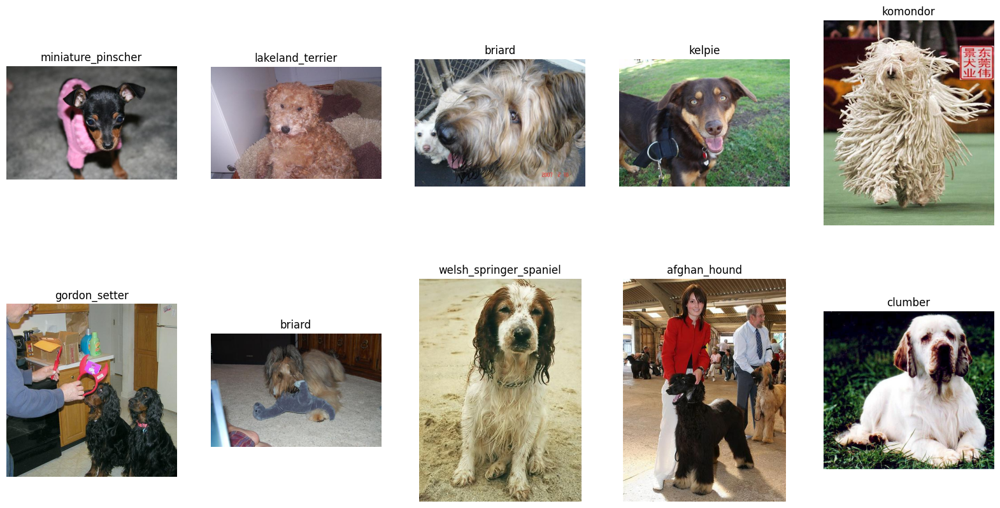

In [41]:
# Plot 10 random images from the train_image_paths
plot_10_random_images_from_path_list(path_list=train_image_paths,
                                     extract_title=False) # don't need to extract the title since the image directories are already named simply

### Making a 10% training dataset split

We've already split the data into training and test sets, so why might we want to make another split?

We're going to make another training split which contains a random 10% (approximately 1,200 images, since the original training set has 12,000 images) of the data from the original training split.

Why?

Because whilst machine learning models generally perform better with more data, having more data means longer computation times.

And longer computation times means the time between our experiments gets longer.

Which is not what we want in the beginning.

Once we find something that does work, we can start to scale up our experiments (more data, bigger models, longer training times - we'll see these later on).

To make our 10% training dataset, let's copy a random 10% of the existing training set to a new folder called `images_split/train_10_percent`, so we've got the layout:

```
images_split/
├── train/
│   ├── class_1/
│   │   ├── train_image1.jpg
│   │   ├── train_image2.jpg
│   │   └── ...
│   ├── class_2/
│   │   ├── train_image1.jpg
│   │   ├── train_image2.jpg
│   │   └── ...
├── train_10_percent/ <--- NEW!
│   ├── class_1/
│   │   ├── random_train_image42.jpg
│   │   └── ...
│   ├── class_2/
│   │   ├── random_train_image106.jpg
│   │   └── ...
└── test/
    ├── class_1/
    │   ├── test_image1.jpg
    │   ├── test_image2.jpg
    │   └── ...
    ├── class_2/
    │   ├── test_image1.jpg
    │   ├── test_image2.jpg
    │   └── ...
```

Let's start by creating that folder.


In [42]:
# Create train_10_percent directory
train_10_percent_dir = images_split_dir / "train_10_percent"
train_10_percent_dir.mkdir(parents=True, exist_ok=True)

Now we should have 3 split folders inside `images_split`.

In [43]:
os.listdir(images_split_dir)

['train_10_percent', 'train', 'test']



Now let's create a list of random training sample filepaths using Python's [`random.sample()`](https://docs.python.org/3/library/random.html#random.sample), we'll want the total length of the list to equal 10% of the original training split.

To make things reproducible, we'll use a random seed (this is not 100% necessary, it just makes it so we get the same 10% of training image paths each time).

In [44]:
import random

# Set a random seed
random.seed(42)

# Get a 10% sample of the training image paths
train_image_paths_random_10_percent = random.sample(population=train_image_paths,
                                                    k=int(0.1*len(train_image_paths)))

# Check how many image paths we got
print(f"Original number of training image paths: {len(train_image_paths)}")
print(f"Number of 10% training image paths: {len(train_image_paths_random_10_percent)}")
print("First 5 random 10% training image paths:")
train_image_paths_random_10_percent[:5]

Original number of training image paths: 12000
Number of 10% training image paths: 1200
First 5 random 10% training image paths:


[PosixPath('images_split/train/clumber/n02101556_6603.jpg'),
 PosixPath('images_split/train/pekinese/n02086079_8229.jpg'),
 PosixPath('images_split/train/kuvasz/n02104029_1206.jpg'),
 PosixPath('images_split/train/maltese_dog/n02085936_3292.jpg'),
 PosixPath('images_split/train/shetland_sheepdog/n02105855_12087.jpg')]

Random 10% training image paths acquired!

Let's copy them to the `images_split/train_10_percent` directory using similar code to our `copy_files_to_target_dir()` function.

In [45]:
# Copy training 10% split images from images_split/train/ to images_split/train_10_percent/...
for source_file_path in tqdm(train_image_paths_random_10_percent):

  # Create the destination file path
  destination_file_and_image_name = Path(*source_file_path.parts[-2:]) # "images_split/train/yorkshire_terrier/n02094433_2223.jpg" -> "yorkshire_terrier/n02094433_2223.jpg"
  destination_file_path = train_10_percent_dir / destination_file_and_image_name # "yorkshire_terrier/n02094433_2223.jpg" -> "images_split/train_10_percent/yorkshire_terrier/n02094433_2223.jpg"

  # If the target directory doesn't exist, make it
  target_class_dir = destination_file_path.parent
  if not target_class_dir.is_dir():
    # print(f"Making directory: {target_class_dir}")
    target_class_dir.mkdir(parents=True,
                           exist_ok=True)

  # print(f"Copying: {source_file_path} to {destination_file_path}")
  copy2(src=source_file_path,
        dst=destination_file_path)

  0%|          | 0/1200 [00:00<?, ?it/s]

1200 images copied!

Let's check our training 10% set distribution and make sure we've got some images for each class.

We can use our `count_images_in_subdirs()` function to count the images in each of the dog breed folders in the `train_10_percent_dir`.

In [46]:
# Count images in train_10_percent_dir
train_10_percent_image_class_counts = count_images_in_subdirs(train_10_percent_dir)
train_10_percent_image_class_counts_df = pd.DataFrame(train_10_percent_image_class_counts).sort_values("image_count", ascending=True)
train_10_percent_image_class_counts_df.head()

,class_name,image_count
33,bloodhound,3
23,bedlington_terrier,4
61,schipperke,4
64,bernese_mountain_dog,4
100,norfolk_terrier,5




Let's make sure there's 120 subfolders by checking the length of the `train_10_percent_image_class_counts_df`.

In [47]:
# How many subfolders are there?
print(len(train_10_percent_image_class_counts_df))

120


 our train 10% dataset split has a folder for each of the dog breed classes.

> **Note:** Ideally our random 10% training set would have the same distribution per class as the original training set, however, for this example, we've taken a global random 10% rather than a random 10% *per class*. This is okay for now, however for more fine-grained tasks, you may want to make sure your smaller training set is better distributed.

For one last check, let's plot the distribution of our train 10% dataset.

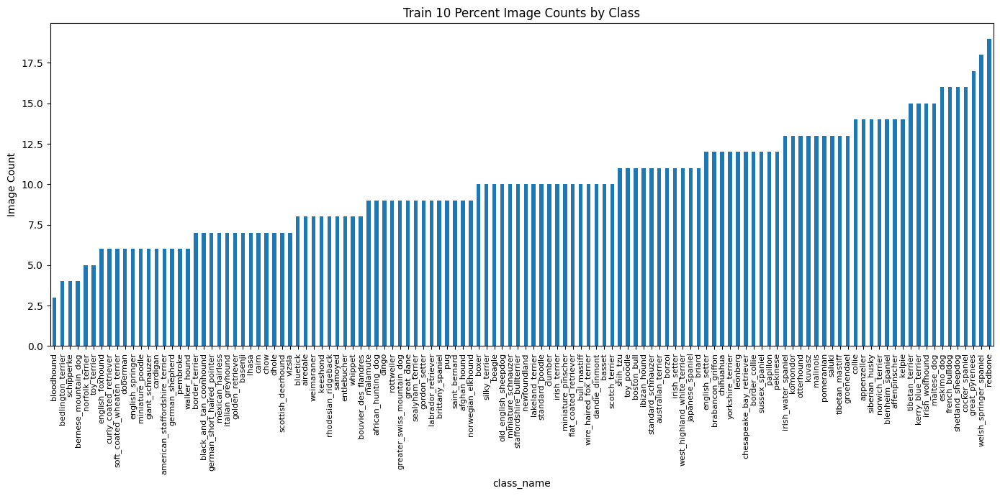

In [48]:
# Plot distribution of train 10% dataset.
plt.figure(figsize=(14, 7))
train_10_percent_image_class_counts_df.plot(kind="bar",
                     x="class_name",
                     y="image_count",
                     legend=False,
                     ax=plt.gca()) # plt.gca() = "get current axis", get the plt we setup above and put the data there

# Add customization
plt.title("Train 10 Percent Image Counts by Class")
plt.ylabel("Image Count")
plt.xticks(rotation=90, # Rotate the x labels for better visibility
           fontsize=8) # Make the font size smaller for easier reading
plt.tight_layout() # Ensure things fit nicely
plt.show()

 Our train 10% dataset distribution looks similar to the original training set distribution.

However, it could be better.

If we really wanted to, we could recreate the train 10% dataset with 10% of the images from *each class* rather than 10% of images globally.



## 5. Turning datasets into TensorFlow Dataset(s)

Since we're working with images, we can do so with `tf.keras.utils.image_dataset_from_directory()`.

We'll pass in the following parameters:

* `directory` = the target directory we'd like to turn into a `tf.data.Dataset`.
* `label_mode` = the kind of labels we'd like to use, in our case it's `"categorical"` since we're dealing with a multi-class classification problem (we would use `"binary"` if we were working with binary classifcation problem).
* `batch_size` = the number of images we'd like our model to see at a time (due to computation limitations, our model won't be able to look at every image at once so we split them into small batches and the model looks at each batch individually), generally [32 is a good value to start](https://x.com/ylecun/status/989610208497360896?s=20), this means our model will look at 32 images at a time (this number is flexible).
* `image_size` = the size we'd like to shape our images to before we feed them to our model (height x width).
* `shuffle` = whether we'd like our dataset to be shuffled to randomize the order.
* `seed` = if we're shuffling the order in a random fashion, do we want that to be reproducible?

> **Note:** Values such as `batch_size` and `image_size` are known as **hyperparameters**, meaning they're values that we can decide what to set them as. As for the best value for a given hyperparameter, that depends highly on the data you're working with, problem space and compute capabilities you've got avaiable. Best to experiment!

With all this being said, let's see it in practice!

We'll make 3 `tf.data.Dataset`'s, `train_10_percent_ds`, `train_ds` and `test_ds`.

In [49]:
import tensorflow as tf

# Create constants
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

# Create train 10% dataset
train_10_percent_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_10_percent_dir,
    label_mode="categorical", # turns labels into one-hot representations (e.g. [0, 0, 1, ..., 0, 0])
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=True, # shuffle training datasets to prevent learning of order
    seed=SEED
)

# Create full train dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_dir,
    label_mode="categorical",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=True,
    seed=SEED
)

# Create test dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
    directory=test_dir,
    label_mode="categorical",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=False, # don't need to shuffle the test dataset (this makes evaluations easier)
    seed=SEED
)

Found 1200 files belonging to 120 classes.
Found 12000 files belonging to 120 classes.
Found 8580 files belonging to 120 classes.


In [50]:
train_10_percent_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

In [51]:
# What does a single batch look like?
image_batch, label_batch = next(iter(train_ds))
image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32, 120]))

In [52]:
# Get a single sample from a single batch
print(f"Single image tensor:\n{image_batch[0]}\n")
print(f"Single label tensor: {label_batch[0]}") # notice the 1 is the index of the target label (our labels are one-hot encoded)
print(f"Single sample class name: {dog_names[tf.argmax(label_batch[0])]}")

Single image tensor:
[[[196.61607  174.61607  160.61607 ]
  [197.84822  175.84822  161.84822 ]
  [200.       178.       164.      ]
  ...
  [ 60.095097  79.75804   45.769207]
  [ 61.83293   71.22575   63.288315]
  [ 77.65755   83.65755   81.65755 ]]

 [[196.       174.       160.      ]
  [197.83876  175.83876  161.83876 ]
  [199.07945  177.07945  163.07945 ]
  ...
  [ 94.573715 110.55229   83.59694 ]
  [125.869865 135.26268  127.33472 ]
  [122.579605 128.5796   126.579605]]

 [[195.73691  173.73691  159.73691 ]
  [196.896    174.896    160.896   ]
  [199.       177.       163.      ]
  ...
  [ 26.679413  38.759026  20.500835]
  [ 24.372307  31.440136  26.675896]
  [ 20.214453  26.214453  24.214453]]

 ...

 [[ 61.57369   70.18976  104.72547 ]
  [189.91965  199.61607  213.28572 ]
  [247.26637  255.       252.70387 ]
  ...
  [113.40158   83.40158   57.40158 ]
  [110.75214   78.75214   53.752136]
  [107.37048   75.37048   50.370483]]

 [[ 61.27007   69.88614  104.42185 ]
  [188.93079  19

### Visualizing images from our TensorFlow Dataset


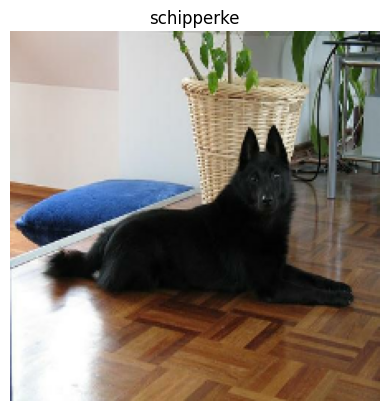

In [53]:
plt.imshow(image_batch[0].numpy().astype("uint8")) # convert tensor to uint8 to avoid matplotlib colour range issues
plt.title(dog_names[tf.argmax(label_batch[0])])
plt.axis("off");

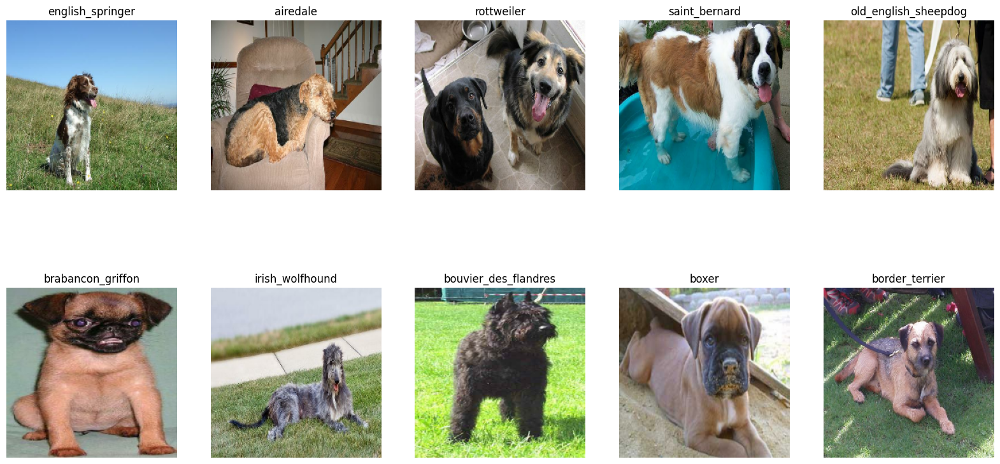

In [54]:
# Create multiple subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 10))

# Iterate through a single batch and plot images
for images, labels in train_ds.take(count=1): # note: because our training data is shuffled, each "take" will be different
  for i, ax in enumerate(axes.flat):
    ax.imshow(images[i].numpy().astype("uint8"))
    ax.set_title(dog_names[tf.argmax(labels[i])])
    ax.axis("off")

In [55]:
# Get the first 5 file paths of the training dataset
train_ds.file_paths[:5]

['images_split/train/boston_bull/n02096585_1753.jpg',
 'images_split/train/kerry_blue_terrier/n02093859_855.jpg',
 'images_split/train/border_terrier/n02093754_2281.jpg',
 'images_split/train/rottweiler/n02106550_11823.jpg',
 'images_split/train/airedale/n02096051_5884.jpg']

We can also get the class names assosciated with a dataset using `.class_names` (TensorFlow has read these from the names of our target folders in the `images_split` directory).

In [56]:
# Get the class names TensorFlow has read from the target directory
class_names = train_ds.class_names
class_names[:5]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier']

And we can make sure the class names are the same across our datasets by comparing them.

In [57]:
assert set(train_10_percent_ds.class_names) == set(train_ds.class_names) == set(test_ds.class_names)

### Configuring our datasets for performance

There's one last step we're going to do before we build our first TensorFlow model.

And that's configure our datasets for performance.


We're going to call three methods on our dataset to optimize it for performance:

* [`cache()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#cache) - Cache the elements in the dataset in memory or a target folder (speeds up loading.
* [`shuffle()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#shuffle) - Shuffle a set number of samples in preparation for loading (this will mean our samples *and* batches of samples will be shuffled), for example, setting `shuffle(buffer_size=1000)` will prepare and shuffle 1000 elements of data at a time.
* [`prefetch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#prefetch) - Prefetch the next batch of data and prepare it for computation whilst the previous one is being computed on (can scale to multiple prefetches depending on hardware availability). TensorFlow can automatically configure how many elements/batches to prefetch by setting `prefetch(buffer_size=tf.data.AUTOTUNE)`.


In our case, let's start by calling `cache()` on our datasets to save the loaded samples to memory.

We'll then `shuffle()` the training splits with `buffer_size=10*BATCH_SIZE` for the training 10% split and `buffer_size=100*BATCH_SIZE` for the full training set.


Ideally if your dataset isn't too large, we would shuffle all possible samples (TensorFlow has a method of finding the number of samples in a dataset called [`tf.data.Dataset.cardinality()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#cardinality)).

We won't call `shuffle()` on the testing dataset since it isn't required.

And we'll call `prefetch(buffer_size=tf.data.AUTOTUNE)` on each of our datasets to automatically load and prepare a number of data batches.


In [58]:
AUTOTUNE = tf.data.AUTOTUNE # let TensorFlow find the best values to use automatically

# Shuffle and optimize performance on training datasets
# Note: these methods can be chained together and will have the same effect as calling them individually
train_10_percent_ds = train_10_percent_ds.cache().shuffle(buffer_size=10*BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
train_ds = train_ds.cache().shuffle(buffer_size=100*BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

# Don't need to shuffle test datasets (for easier evaluation)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

## 6. Creating a neural network with TensorFlow





In [59]:
# Create the input shape to our model
INPUT_SHAPE = (*IMG_SIZE, 3)

base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=True, # do want to include the top layer? (ImageNet has 1000 classes, so the top layer is formulated for this, we want to create our own top layer)
    include_preprocessing=True, # do we want the network to preprocess our data into the right format for us? (yes)
    weights="imagenet", # do we want the network to come with pretrained weights? (yes)
    input_shape=INPUT_SHAPE # what is the input shape of our data we're going to pass to the network? (224, 224, 3) -> (height, width, colour_channels)
)

29403144/29403144 [==============================] - 3s 0us/step


Base model created!

We can find out information about our base model by calling `base_model.summary()`.

In [60]:
# Note: Uncomment to see full output
base_model.summary()

Model: "efficientnetv2-b0"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 224, 224, 3)          0         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 stem_conv (Conv2D)          (None, 112, 112, 32)         864       ['normalizatio

In [61]:
# Count the number of layers
print(f"Number of layers in base_model: {len(base_model.layers)}")

Number of layers in base_model: 273


let's pay attention to a few things:

* The **input layer** (the first layer) input shape, this will tell us the shape of the data the model expects as input.
* The **output layer** (the last layer) output shape, this will tell us the shape of the data the model will output.
* The **number of parameters** of the model, these are "learnable" numbers (also called weights) that a model will use to derive patterns out of and represent the data. Generally, the more parameters a model has, the more learning capacity it has.
* The **number of layers** a model has. Generally, the more layers a model has, the more learning capacity it has (each layer will learn progressively deeper patterns from the data). However, this caps out at a certain range.

Let's step through each of these.


### Model input and output shapes

One of the most important practical steps in using a deep learning model is input and output shapes.

Two questions to ask:

* What is the shape of my input data?
* What is the ideal shape of my output data?

In our case, our input data has the shape of `[(32, 224, 224, 3)]` or `[(batch_size, height, width, colour_channels)]`.

And our ideal output shape will be `[(32, 120)]` or `[(batch_size, number_of_dog_classes)`.




In [62]:
# Check the input shape of our model
base_model.input_shape

(None, 224, 224, 3)

In [63]:
# Check the model's output shape
base_model.output_shape

(None, 1000)

In [64]:
# Create a base model with no top
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False, # don't include the top layer (we want to make our own top layer)
    include_preprocessing=True,
    weights="imagenet",
    input_shape=INPUT_SHAPE,
)

# Check the output shape
base_model.output_shape

24274472/24274472 [==============================] - 2s 0us/step


(None, 7, 7, 1280)

In [65]:
# Count the number of layers
print(f"Number of layers in base_model: {len(base_model.layers)}")

Number of layers in base_model: 270


Looks like our new `base_model` has less layers than our previous one.

This is because we used `include_top=False`.

This means we've still got 270 base layers to extract features and patterns from our images, however, it also means we get to **customize the output layers to our liking**.

We'll come back to this shortly.

### Model parameters

In traditional programming, we define rules for inputs and outputs. In machine learning, the model learns the rules from inputs and ideal outputs.

More parameters mean more learning capacity. Transfer learning leverages pre-trained models, saving time.

Use .count_params() to check the number of parameters in a model or layer.








In [66]:
# Check the number of parameters in our model
base_model.count_params()

5919312

Our model has 5,919,312 parameters!

That means each time an image goes through our model, it will be influenced in some small way by 5,919,312 numbers.

Each one of these is a potential learning opportunity (except for parameters that are non-trainable but we'll get to that soon too).

Generally, more parameters leads to better models.

However, there are always tradeoffs.

More parameters means more compute power to run the models.

We can get the trainable and non-trainable parameters from our model with the [`trainable_weights`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Layer) and [`non_trainable_weights`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Layer) attributes (remember, parameters are also referred to as weights).


Let's write a function to count the trainable, non-trainable and trainable parameters of a model.

In [67]:
import numpy as np

def count_parameters(model, print_output=True):
  """
  Counts the number of trainable, non-trainable and total parameters of a given model.
  """
  trainable_parameters = np.sum([np.prod(layer.shape) for layer in model.trainable_weights])
  non_trainable_parameters = np.sum([np.prod(layer.shape) for layer in model.non_trainable_weights])
  total_parameters = trainable_parameters + non_trainable_parameters
  if print_output:
    print(f"Model {model.name} parameter counts:")
    print(f"Total parameters: {total_parameters}")
    print(f"Trainable parameters: {trainable_parameters}")
    print(f"Non-trainable parameters: {non_trainable_parameters}")
  else:
    return total_parameters, trainable_parameters, non_trainable_parameters

count_parameters(model=base_model, print_output=True)

Model efficientnetv2-b0 parameter counts:
Total parameters: 5919312
Trainable parameters: 5858704
Non-trainable parameters: 60608


In [68]:
# Freeze the base model
base_model.trainable = False
base_model.trainable

False

`base_model` frozen!

Now let's check the number of trainable and non-trainable parameters.

In [69]:
count_parameters(model=base_model, print_output=True)

Model efficientnetv2-b0 parameter counts:
Total parameters: 5919312.0
Trainable parameters: 0.0
Non-trainable parameters: 5919312


### Passing data through our model



In [70]:
# Current image shape
shape_of_image_without_batch = image_batch[0].shape

# Add a batch dimension to our single image
shape_of_image_with_batch = tf.expand_dims(input=image_batch[0], axis=0).shape

print(f"Shape of image without batch: {shape_of_image_without_batch}")
print(f"Shape of image with batch: {shape_of_image_with_batch}")

Shape of image without batch: (224, 224, 3)
Shape of image with batch: (1, 224, 224, 3)


In [71]:
# Extract features from a single image using our base model
feature_extraction = base_model(tf.expand_dims(image_batch[0], axis=0))
feature_extraction

<tf.Tensor: shape=(1, 7, 7, 1280), dtype=float32, numpy=
array([[[[-2.19177201e-01, -3.44185606e-02, -1.40321642e-01, ...,
          -1.44454449e-01, -2.73809850e-01, -7.41252452e-02],
         [-8.69670734e-02, -6.48750067e-02, -2.14546964e-01, ...,
          -4.57209721e-02, -2.77900100e-01, -8.20885971e-02],
         [-2.76872963e-01, -8.26781020e-02, -3.85153107e-02, ...,
          -2.72128999e-01, -2.52802134e-01, -2.28105962e-01],
         ...,
         [-1.01604000e-01, -3.55145968e-02, -2.23027021e-01, ...,
          -2.26227805e-01, -8.61771777e-02, -1.60450727e-01],
         [-5.87608740e-02, -4.65543661e-03, -1.06193267e-01, ...,
          -2.87548676e-02, -9.06914026e-02, -1.82624385e-01],
         [-6.27618432e-02, -1.38620799e-03,  1.52704502e-02, ...,
          -7.85450079e-03, -1.84584558e-01, -2.62404829e-01]],

        [[-2.17334151e-01, -1.10280879e-01, -2.74605274e-01, ...,
          -2.22405165e-01, -2.74738282e-01, -1.01998925e-01],
         [-1.40700653e-01, -1.6

In [72]:
# Check shape of feature extraction
feature_extraction.shape

TensorShape([1, 7, 7, 1280])

In [73]:
num_input_features = 224*224*3
feature_extraction_features = 1*7*7*1280

# Calculate the compression ratio
num_input_features / feature_extraction_features

2.4

In [74]:
# Turn feature extraction into a feature vector
feature_vector = tf.keras.layers.GlobalAveragePooling2D()(feature_extraction) # pass feature_extraction to the pooling layer
feature_vector

<tf.Tensor: shape=(1, 1280), dtype=float32, numpy=
array([[-0.11521906, -0.04476562, -0.12476546, ..., -0.09118073,
        -0.08420841, -0.07769417]], dtype=float32)>

In [75]:
# Check out the feature vector shape
feature_vector.shape

TensorShape([1, 1280])

In [76]:
# Compare the reduction
num_input_features = 224*224*3
feature_extraction_features = 1*7*7*1280
feature_vector_features = 1*1280

print(f"Input -> feature extraction reduction factor: {num_input_features / feature_extraction_features}")
print(f"Feature extraction -> feature vector reduction factor: {feature_extraction_features / feature_vector_features}")
print(f"Input -> feature extraction -> feature vector reduction factor: {num_input_features / feature_vector_features}")

Input -> feature extraction reduction factor: 2.4
Feature extraction -> feature vector reduction factor: 49.0
Input -> feature extraction -> feature vector reduction factor: 117.6


### Going from image to feature vector (practice)


We can then use this lower dimensional form for our specific use cases.

And one of the most powerful ways to do this is with transfer learning.

Taking an existing model from a similar domain to yours and applying it to your own problem.

To practice turning a data sample into a feature vector, let's start by recreating a `base_model` instance.

This time, we can add in a pooling layer automatically using `pooling="avg"` or `pooling="max"`.


In [77]:
# Create a base model with no top and a pooling layer built-in
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=INPUT_SHAPE,
    pooling="avg", # can also use "max"
    include_preprocessing=True,
)

# Check the summary (optional)
# base_model.summary()

# Check the output shape
base_model.output_shape

(None, 1280)

In [78]:
# Freeze the base weights
base_model.trainable = False

# Count the parameters
count_parameters(model=base_model, print_output=True)

Model efficientnetv2-b0 parameter counts:
Total parameters: 5919312.0
Trainable parameters: 0.0
Non-trainable parameters: 5919312


In [79]:
# Get a feature vector of a single image (don't forget to add a batch dimension)
feature_vector_2 = base_model(tf.expand_dims(image_batch[0], axis=0))
feature_vector_2

<tf.Tensor: shape=(1, 1280), dtype=float32, numpy=
array([[-0.11521906, -0.04476562, -0.12476546, ..., -0.09118073,
        -0.08420841, -0.07769417]], dtype=float32)>

In [80]:
# Compare the two feature vectors
np.all(feature_vector == feature_vector_2)

True

### Creating a custom model for our dog vision problem

The main steps when creating any kind of deep learning model from scratch are:

1. Define the input layer(s).
2. Define the middle layer(s).
3. Define the output layer(s).



### Creating a model with the Sequential API

The Sequential API is the most straightforward way to create a model.


In [81]:
# Create a sequential model
tf.random.set_seed(42)
sequential_model = tf.keras.Sequential([base_model, # input and middle layers
                                        tf.keras.layers.Dense(units=len(dog_names), # output layer
                                                              activation="softmax")])
sequential_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-b0 (Functio  (None, 1280)              5919312   
 nal)                                                            
                                                                 
 dense (Dense)               (None, 120)               153720    
                                                                 
Total params: 6073032 (23.17 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 5919312 (22.58 MB)
_________________________________________________________________


In [82]:
# Check the input shape
sequential_model.input_shape

(None, 224, 224, 3)

In [83]:
# Check the output shape
sequential_model.output_shape

(None, 120)

In [84]:
# Get a single image with a batch size of 1
single_image_input = tf.expand_dims(image_batch[0], axis=0)

# Pass the image through our model
single_image_output_sequential = sequential_model(single_image_input)

# Check the output
single_image_output_sequential

<tf.Tensor: shape=(1, 120), dtype=float32, numpy=
array([[0.00783153, 0.01119391, 0.00476165, 0.0072348 , 0.00766934,
        0.00753752, 0.00522398, 0.02337082, 0.00579716, 0.00539333,
        0.00549823, 0.01011768, 0.00610076, 0.0109506 , 0.00540159,
        0.0079683 , 0.01227358, 0.01056393, 0.00507148, 0.00996652,
        0.00604106, 0.00729022, 0.0155036 , 0.00745004, 0.00628229,
        0.00796217, 0.00905823, 0.00712278, 0.01243507, 0.006427  ,
        0.00602891, 0.01276839, 0.00652441, 0.00842482, 0.01247454,
        0.00749902, 0.01086363, 0.007803  , 0.0058652 , 0.00474356,
        0.00902809, 0.00715358, 0.00981051, 0.00444271, 0.01031628,
        0.00691859, 0.00699083, 0.0065892 , 0.00966169, 0.01177148,
        0.00908043, 0.00729699, 0.00496712, 0.00509035, 0.00584058,
        0.01068885, 0.00817651, 0.00602052, 0.00901201, 0.01008151,
        0.00495409, 0.01285929, 0.00480146, 0.0108622 , 0.01421483,
        0.00814719, 0.00910061, 0.00798947, 0.00789293, 0.00636969

In [85]:
# Sum the output
np.sum(single_image_output_sequential)

1.0

In [86]:
# Find the index with the highest value
highest_value_index_sequential_model_output = np.argmax(single_image_output_sequential)
highest_value_sequential_model_output = np.max(single_image_output_sequential)

print(f"Highest value index: {highest_value_index_sequential_model_output} ({dog_names[highest_value_index_sequential_model_output]})")
print(f"Prediction probability: {highest_value_sequential_model_output}")

Highest value index: 7 (basenji)
Prediction probability: 0.023370817303657532




This prediction probability value is quite low.

With the highest potential value being `1.0`, it means the model isn't very confident on its prediction.

Let's check the original label value of our single image.

In [87]:
# Check the original label value
print(f"Predicted value: {highest_value_index_sequential_model_output}")
print(f"Actual value: {tf.argmax(label_batch[0]).numpy()}")

Predicted value: 7
Actual value: 95


Looks like our model predicted the wrong label (or if it got it right, it was by pure chance).



In [88]:
# Index on class_names with our model's highest prediction probability
sequential_model_predicted_label = class_names[tf.argmax(sequential_model(tf.expand_dims(image_batch[0], axis=0)), axis=1).numpy()[0]]

# Get the truth label
single_image_ground_truth_label = class_names[tf.argmax(label_batch[0])]

# Print predicted and ground truth labels
print(f"Sequential model predicted label: {sequential_model_predicted_label}")
print(f"Ground truth label: {single_image_ground_truth_label}")

Sequential model predicted label: basenji
Ground truth label: schipperke


### Creating a model with the Functional API

We'll follow the same process as mentioned before:
1. Define the input layer(s).
2. Define the middle/hidden layer(s).
3. Define the output layer(s).
4. Bonus: Connect the inputs and outputs within an instance of [`tf.keras.Model()`](https://www.tensorflow.org/api_docs/python/tf/keras/Model).

In [89]:
# 1. Create input layer
inputs = tf.keras.Input(shape=INPUT_SHAPE)

# 2. Create hidden layer
x = base_model(inputs, training=False)

# 3. Create the output layer
outputs = tf.keras.layers.Dense(units=len(class_names), # one output per class
                                activation="softmax",
                                name="output_layer")(x)

# 4. Connect the inputs and outputs together
functional_model = tf.keras.Model(inputs=inputs,
                                  outputs=outputs,
                                  name="functional_model")

# Get a model summary
functional_model.summary()

Model: "functional_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, 1280)              5919312   
 nal)                                                            
                                                                 
 output_layer (Dense)        (None, 120)               153720    
                                                                 
Total params: 6073032 (23.17 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 5919312 (22.58 MB)
_________________________________________________________________


In [90]:
# Pass a single image through our functional_model
single_image_output_functional = functional_model(single_image_input)

# Find the index with the highest value
highest_value_index_functional_model_output = np.argmax(single_image_output_functional)
highest_value_functional_model_output = np.max(single_image_output_functional)

highest_value_index_functional_model_output, highest_value_functional_model_output

(69, 0.017855722)

### Functionizing model creation

We've created two different kinds of models so far.

Each of which use the same layers.

Except one was with the Keras Sequential API and the other was with the Keras Functional API.

However, it would be quite tedious to rewrite that modelling code every time we wanted to create a new model.

So let's create a function called `create_model()` to replicate the model creation step with the Functional API.



In [91]:
def create_model(include_top: bool = False,
                 num_classes: int = 1000,
                 input_shape: tuple[int, int, int] = (224, 224, 3),
                 include_preprocessing: bool = True,
                 trainable: bool = False,
                 dropout: float = 0.2,
                 model_name: str = "model") -> tf.keras.Model:
  """
  Create an EfficientNetV2 B0 feature extractor model with a custom classifier layer.

  Args:
      include_top (bool, optional): Whether to include the top (classifier) layers of the model.
      num_classes (int, optional): Number of output classes for the classifier layer.
      input_shape (tuple[int, int, int], optional): Input shape for the model's images (height, width, channels).
      include_preprocessing (bool, optional): Whether to include preprocessing layers for image normalization.
      trainable (bool, optional): Whether to make the base model trainable.
      dropout (float, optional): Dropout rate for the global average pooling layer.
      model_name (str, optional): Name for the created model.

  Returns:
      tf.keras.Model: A TensorFlow Keras model with the specified configuration.
  """
  # Create base model
  base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=include_top,
    weights="imagenet",
    input_shape=input_shape,
    include_preprocessing=include_preprocessing,
    pooling="avg" # Can use this instead of adding tf.keras.layers.GlobalPooling2D() to the model
    # pooling="max" # Can use this instead of adding tf.keras.layers.MaxPooling2D() to the model
  )

  # Freeze the base model (if necessary)
  base_model.trainable = trainable

  # Create input layer
  inputs = tf.keras.Input(shape=input_shape, name="input_layer")

  # Create model backbone (middle/hidden layers)
  x = base_model(inputs, training=trainable)
  # x = tf.keras.layers.GlobalAveragePooling2D()(x) # note: you should include pooling here if not using `pooling="avg"`
  # x = tf.keras.layers.Dropout(0.2)(x) # optional regularization layer (search "dropout" for more)

  # Create output layer (also known as "classifier" layer)
  outputs = tf.keras.layers.Dense(units=num_classes,
                                  activation="softmax",
                                  name="output_layer")(x)

  # Connect input and output layer
  model = tf.keras.Model(inputs=inputs,
                         outputs=outputs,
                         name=model_name)

  return model

In [92]:
# Create a model
model_0 = create_model(num_classes=len(class_names))
model_0.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, 1280)              5919312   
 nal)                                                            
                                                                 
 output_layer (Dense)        (None, 120)               153720    
                                                                 
Total params: 6073032 (23.17 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 5919312 (22.58 MB)
_________________________________________________________________


In [93]:
for layer in model_0.layers:
  print(layer.name, layer.trainable)

input_layer True
efficientnetv2-b0 False
output_layer True


## 7. Model 0 - Train a model on 10% of the training data

We've seen our model make a couple of predictions on our data.

And so far it hasn't done so well.

This is expected though.

Our model is essentially predicting random class values given an image.

Let's change that.

How?

By training the final layer on our model to be customized to recognizing images of dogs.

We can do so via five steps:

1. **Creating the model** - We've done this ✅.
2. **Compiling the model** - Here's where we'll tell the model how to improve itself and how to measure its performance.
3. **Fitting the model** - Here's where we'll show the model examples of what we'd like it to learn (e.g. batches of samples containing pairs of dog images and their breed).
4. **Evaluating the model** - Once our model is trained on the training data, we can evaluate it on the testing data (data the model has never seen).
5. **Making a custom prediction** - Finally, the best way to test a machine learning model is by seeing how it goes on custom data. This is where we'll try to make a prediction on our own custom images of dogs.

We'll work through each of these over the next few sections.



In [94]:
# 1. Create model
model_0 = create_model(num_classes=len(class_names),
                       model_name="model_0")

model_0.summary()

Model: "model_0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, 1280)              5919312   
 nal)                                                            
                                                                 
 output_layer (Dense)        (None, 120)               153720    
                                                                 
Total params: 6073032 (23.17 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 5919312 (22.58 MB)
_________________________________________________________________


### Compiling a model




In [95]:
# Create optimizer (short version)
optimizer = "adam"

# The above line is the same as below
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
optimizer

### Which loss function should I use?

A loss function measures how *wrong* your model's predictions are.

A model with poor predictions in comparison to the truth data will have a high loss value.

Where as a model with perfect predictions (e.g. it gets every prediction correct) will have a loss value of 0.

In our case, since we're working with multi-class classification (multiple different dog breeds) and our labels are one-hot encoded, we'll be using `tf.keras.losses.CategoricalCrossentropy`.

We can leave all of the default parameters as they are as well.

However, if we didn't have `activation="softmax"` in the final layer of our model, we'd have to change `from_logits=False` to `from_logits=True` as the softmax activation function does this conversion for us.



In [96]:
# Check that our labels are one-hot encoded
label_batch[0]

<tf.Tensor: shape=(120,), dtype=float32, numpy=
array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0.], dtype=float32)>

In [97]:
# Create our loss function
loss = tf.keras.losses.CategoricalCrossentropy(from_logits=False) # use from_logits=False if using an activation function in final layer of model (default)
loss

In [98]:
# Create list of evaluation metrics
metrics = ["accuracy"]

### Putting it all together and compiling our model


1. Creating the optimizer.
2. Creating the loss function.
3. Creating the evaluation metrics.



In [99]:
# Compile model with shortcuts (faster to write code but less customizable)
model_0.compile(optimizer="adam",
                loss="categorical_crossentropy",
                metrics=["accuracy"])

# Compile model with classes (will do the same as above)
model_0.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                metrics=["accuracy"])

### Fitting a model on the data


Fitting the model is step 3 in our list:

1. **Creating the model** - We've done this
2. **Compiling the model** - We've done this
3. **Fitting the model** - Here's where we'll show the model examples of what we'd like it to learn (e.g. the relationship between an image of a dog and its breed).
4. **Evaluating the model** - Once our model is trained on the training data, we can evaluate it on the testing data (data the model has never seen).
5. **Making a custom prediction** - Finally, the best way to test a machine learning model is by seeing how it goes on custom data. This is where we'll try to make a prediction on our own custom images of dogs.

We can fit our `model_0` instance with the [`tf.keras.Model.fit()`](https://www.tensorflow.org/api_docs/python/tf/keras/Model#fit) method.

The main parameters of the `fit()` method we'll be paying attention to are:

* `x` = What data do you want the model to *train* on?
* `y` = What labels do you want your model to learn the patterns from your data to?
* `batch_size` = The number of samples your model will look at per gradient update (e.g. 32 samples at a time before updating its internal patterns).
* `epochs` = How many times do you want the model to go through all samples (e.g. `epochs=5` means looking at all of the data 5 times)?
* `validation_data` = What data do you want to *evaluate* your model's learning on?

There are plenty more options in the TensorFlow/Keras documentation for the `fit()` method.

However, these options will be more than enough for us.

In our case, let's keep our experiments quick and set the following:
* `x=train_10_percent_ds` - Since we've crafted a `tf.data.Dataset`, our `x` and `y` values are combined into one. We'll also start by training on 10% of the data for quicker experimentation (if things work on a smaller subset of the data, we can always increase it).
* `epochs=5` - The more epochs you do, the more opportunities your model has to learn patterns, however, it also prolongs training.
* `validation_data=test_ds` - We'll evaluate the model's learning on the test dataset (samples its never seen before).



In [100]:
# Fit model_0 for 5 epochs
epochs = 5
history_0 = model_0.fit(x=train_10_percent_ds,
                        epochs=epochs,
                        validation_data=test_ds)

Epoch 1/5
38/38 [==============================] - 27s 482ms/step - loss: 3.9678 - accuracy: 0.2758 - val_loss: 3.0498 - val_accuracy: 0.5279
Epoch 2/5
38/38 [==============================] - 14s 383ms/step - loss: 2.0407 - accuracy: 0.7567 - val_loss: 1.8738 - val_accuracy: 0.6707
Epoch 3/5
38/38 [==============================] - 14s 390ms/step - loss: 1.0507 - accuracy: 0.8975 - val_loss: 1.2879 - val_accuracy: 0.7449
Epoch 4/5
38/38 [==============================] - 14s 387ms/step - loss: 0.6183 - accuracy: 0.9525 - val_loss: 1.0155 - val_accuracy: 0.7894
Epoch 5/5
38/38 [==============================] - 14s 382ms/step - loss: 0.4146 - accuracy: 0.9733 - val_loss: 0.8744 - val_accuracy: 0.8063


Our model's performance is impressive!

Achieving a validation accuracy of ~80% after just 5 epochs of training is a huge win, especially when compared to the original Stanford Dogs paper, which only reached 22% accuracy. This demonstrates just how effective transfer learning can be in improving performance with minimal training time.

So, how did we get there?

This success comes from the power of transfer learning, where we leverage pre-trained models and apply them to new tasks, rather than starting from scratch. In addition, advancements in neural network architectures, hardware, and training techniques have made it possible to achieve results like this in much shorter time frames than before.

However, these numbers alone don't tell the full story. Achieving high validation accuracy is just one part of the puzzle. It’s crucial that we dive deeper into evaluation metrics, considering precision, recall, confusion matrices, and loss functions to fully understand how well our model is generalizing.

For now, though, let's quickly review the three key steps we've practiced: create, compile, fit.

Create: We start by building the model, defining the architecture and layers. This is where we decide on the structure of our neural network, such as how many layers and neurons it will have. By choosing the right architecture, we set the foundation for the model's ability to learn from the data.
Compile: After creating the model, we need to compile it. This involves choosing the right optimizer, loss function, and evaluation metrics. The optimizer helps adjust the model's parameters during training, while the loss function quantifies how far the model’s predictions are from the actual values, guiding the model in its learning process.
Fit: Finally, we train the model using the fit() method. During this phase, we provide our training data, define the number of epochs, and allow the model to adjust its parameters through backpropagation. This is where the model actually learns from the data, improving its accuracy step by step.
These three steps are essential, and mastering them forms the core of building a successful machine learning model. We’ll dive deeper into evaluation techniques soon, but for now, we’ve already accomplished something remarkable—just 5 epochs in!

## 8. Putting it all together: create, compile, fit



In [101]:
# 1. Create a model
model_0 = create_model(num_classes=len(dog_names))

# 2. Compile the model
model_0.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

# 3. Fit the model
epochs = 5
history_0 = model_0.fit(x=train_10_percent_ds,
                        epochs=epochs,
                        validation_data=test_ds)

Epoch 1/5
38/38 [==============================] - 22s 425ms/step - loss: 3.9069 - accuracy: 0.3158 - val_loss: 3.0100 - val_accuracy: 0.5318
Epoch 2/5
38/38 [==============================] - 14s 384ms/step - loss: 2.0038 - accuracy: 0.7717 - val_loss: 1.8554 - val_accuracy: 0.6720
Epoch 3/5
38/38 [==============================] - 14s 388ms/step - loss: 1.0297 - accuracy: 0.8892 - val_loss: 1.2757 - val_accuracy: 0.7564
Epoch 4/5
38/38 [==============================] - 14s 387ms/step - loss: 0.6072 - accuracy: 0.9483 - val_loss: 1.0104 - val_accuracy: 0.7955
Epoch 5/5
38/38 [==============================] - 14s 384ms/step - loss: 0.4076 - accuracy: 0.9725 - val_loss: 0.8703 - val_accuracy: 0.8085


### Evaluate Model 0 on the test data



There are several ways to evaluate a model:
* Look at the metrics (such as accuracy).
* Plot the loss curves.
* Make predictions on the test set and compare them to the truth labels.
* Make predictions on custom samples (not contained in the training or test sets).




In [102]:
# Inspect History.history attribute for model_0
history_0.history

{'loss': [3.90690016746521,
  2.003844976425171,
  1.0296696424484253,
  0.6071516871452332,
  0.40761926770210266],
 'accuracy': [0.31583333015441895,
  0.7716666460037231,
  0.8891666531562805,
  0.9483333230018616,
  0.9725000262260437],
 'val_loss': [3.010030508041382,
  1.8553518056869507,
  1.2757066488265991,
  1.010423183441162,
  0.8703389167785645],
 'val_accuracy': [0.5318182110786438,
  0.6720279455184937,
  0.7564102411270142,
  0.7954545617103577,
  0.8085081577301025]}

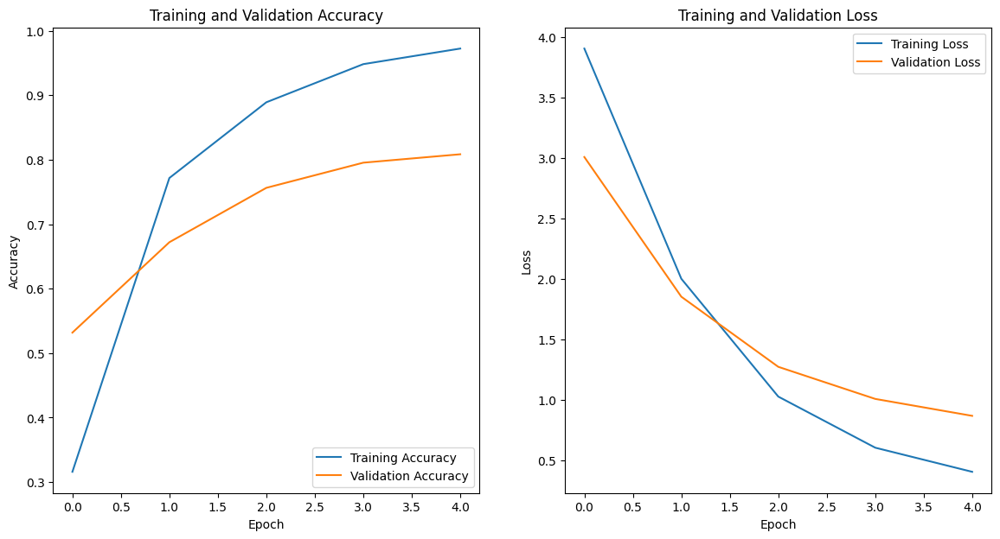

In [103]:
def plot_model_loss_curves(history: tf.keras.callbacks.History) -> None:
  """Takes a History object and plots loss and accuracy curves."""

  # Get the accuracy values
  acc = history.history["accuracy"]
  val_acc = history.history["val_accuracy"]

  # Get the loss values
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  # Get the number of epochs
  epochs_range = range(len(acc))

  # Create accuracy curves plot
  plt.figure(figsize=(14, 7))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label="Training Accuracy")
  plt.plot(epochs_range, val_acc, label="Validation Accuracy")
  plt.legend(loc="lower right")
  plt.title("Training and Validation Accuracy")
  plt.xlabel("Epoch")
  plt.ylabel("Accuracy")

  # Create loss curves plot
  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label="Training Loss")
  plt.plot(epochs_range, val_loss, label="Validation Loss")
  plt.legend(loc="upper right")
  plt.title("Training and Validation Loss")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")

  plt.show()

plot_model_loss_curves(history=history_0)



Our model is doing exactly what we'd like it to do.

The accuracy is moving up while the loss is going down.

### Overfitting and underfitting (when your model doesn't perform how you'd like)
Ideally, the two lines would closely follow each other.

In our case, the validation loss doesn't decrease as low as the training loss.

This is known as [**overfitting**](https://developers.google.com/machine-learning/crash-course/generalization/peril-of-overfitting), a common problem in machine learning where a model learns the training data very well but doesn't generalize to other unseen data.

The reverse of overfitting is [**underfitting**](https://developers.google.com/machine-learning/glossary), which is when a model fails to learn anything useful. For example, it never manages to increase accuracy or decrease loss.

 our model isn't underfitting (it's performing at ~80% accuracy on unseen data).



In [104]:
# Evaluate model_0, see: https://www.tensorflow.org/api_docs/python/tf/keras/Model#evaluate
model_0_results = model_0.evaluate(x=test_ds)
model_0_results

269/269 [==============================] - 13s 48ms/step - loss: 0.8703 - accuracy: 0.8085


[0.8703389167785645, 0.8085081577301025]

In [105]:
# Get our model's metrics names
model_0.metrics_names

['loss', 'accuracy']

## 9. Model 1 - Train a model on 100% of the training data

We've trained a model on 10% of the training data (to see if it works and it did!), now let's train a model on 100% of the training data and see what happens.

Let's follow our three steps from before:

1. Create a model (using our `create_model()`) function.
2. Compile our model (selecting our optimizer, loss function and evaluation metric).
3. Fit our model (this time on 100% of the data for 5 epochs).



In [106]:
# 1. Create model_1 (the next iteration of model_0)
model_1 = create_model(num_classes=len(class_names),
                       model_name="model_1")

# 2. Compile model
model_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

# 3. Fit model
epochs=5
history_1 = model_1.fit(x=train_ds,
                        epochs=epochs,
                        validation_data=test_ds)

Epoch 1/5
375/375 [==============================] - 44s 87ms/step - loss: 1.2684 - accuracy: 0.7628 - val_loss: 0.4881 - val_accuracy: 0.8714
Epoch 2/5
375/375 [==============================] - 31s 83ms/step - loss: 0.3666 - accuracy: 0.8997 - val_loss: 0.4020 - val_accuracy: 0.8781
Epoch 3/5
375/375 [==============================] - 30s 81ms/step - loss: 0.2621 - accuracy: 0.9287 - val_loss: 0.3763 - val_accuracy: 0.8824
Epoch 4/5
375/375 [==============================] - 31s 82ms/step - loss: 0.2038 - accuracy: 0.9477 - val_loss: 0.3694 - val_accuracy: 0.8818
Epoch 5/5
375/375 [==============================] - 31s 82ms/step - loss: 0.1610 - accuracy: 0.9601 - val_loss: 0.3688 - val_accuracy: 0.8823


### Evaluate Model 1 on the test data



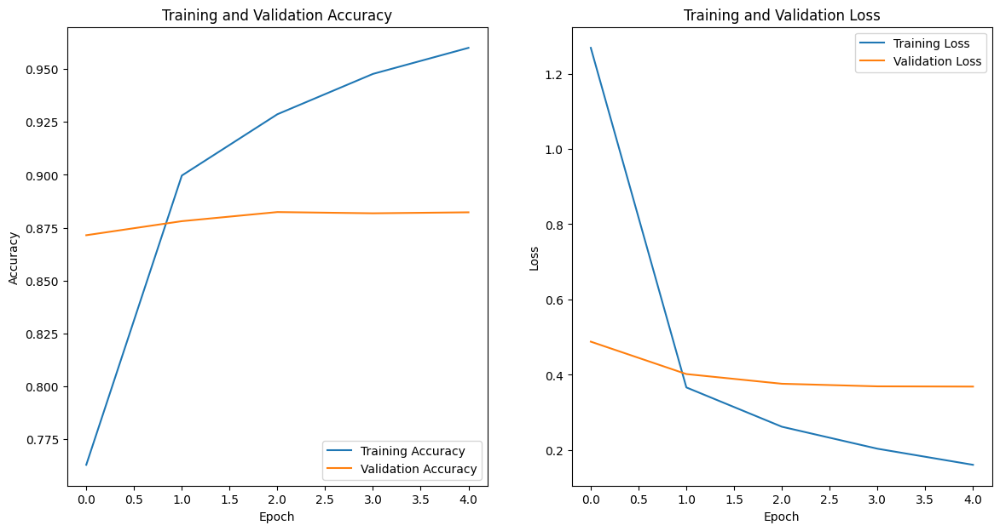

In [107]:
# Plot model_1 loss curves
plot_model_loss_curves(history=history_1)



Whereas, the training accuracy and loss seemed to keep improving.

This is a sign of overfitting (model performing much better on the training set than the validation/test set).

However, since our model looks to be performing quite well I'll leave this overfitting problem as a research project for extra-curriculum.

For now, let's evaluate our model on the test dataset using the `evaluate()` method.

In [108]:
# Evaluate model_1
model_1_results = model_1.evaluate(test_ds)

269/269 [==============================] - 13s 48ms/step - loss: 0.3688 - accuracy: 0.8823


## 10. Make and evaluate predictions of the best model



In [109]:
# This will output logits (as long as softmax activation isn't in the model)
test_preds = model_1.predict(test_ds)

# Note: If not using activation="softmax" in last layer of model, may need to turn them into prediction probabilities (easier to understand)
# test_preds = tf.keras.activations.softmax(tf.constant(test_preds), axis=-1)

269/269 [==============================] - 14s 46ms/step


Let's inspect our `test_preds` by first checking its shape.

In [110]:
test_preds.shape

(8580, 120)

In [111]:
# Get a "random" variable between all of the test samples
random.seed(42)
random_test_index = random.randint(0, test_preds.shape[0] - 1)
print(f"[INFO] Random test index: {random_test_index}")

# Inspect a single test prediction sample
random_test_pred_sample = test_preds[random_test_index]

print(f"[INFO] Random test pred sample shape: {random_test_pred_sample.shape}")
print(f"[INFO] Random test pred sample argmax: {tf.argmax(random_test_pred_sample)}")
print(f"[INFO] Random test pred sample label: {dog_names[tf.argmax(random_test_pred_sample)]}")
print(f"[INFO] Random test pred sample max prediction probability: {tf.reduce_max(random_test_pred_sample)}")
print(f"[INFO] Random test pred sample prediction probability values:\n{random_test_pred_sample}")

[INFO] Random test index: 1824
[INFO] Random test pred sample shape: (120,)
[INFO] Random test pred sample argmax: 24
[INFO] Random test pred sample label: brittany_spaniel
[INFO] Random test pred sample max prediction probability: 0.9572659730911255
[INFO] Random test pred sample prediction probability values:
[2.0447667e-06 3.1844644e-05 2.3624800e-06 1.5769443e-05 1.3313751e-06
 6.1607966e-06 1.7373977e-06 4.0091286e-06 1.2210279e-06 4.4672613e-04
 5.3999579e-06 1.6363579e-06 5.6143153e-07 2.0673669e-04 9.2527421e-07
 4.5905135e-06 1.4758026e-05 1.7143029e-06 4.0526847e-05 2.8369135e-07
 5.6872113e-07 1.3330267e-06 1.0428280e-06 3.3734757e-06 9.5726597e-01
 2.5933311e-06 1.2246442e-06 1.0763024e-06 1.0315061e-05 1.6276817e-05
 8.6787202e-07 1.6321700e-04 5.5287237e-05 3.1323350e-05 3.7939285e-06
 1.3830589e-07 2.4159942e-06 4.5496367e-06 5.5434060e-07 1.0157129e-03
 3.3694923e-02 6.6573040e-05 5.2655600e-06 2.5172681e-06 1.5906862e-05
 3.3647893e-07 1.0382691e-06 5.1398616e-04 2.302

In [112]:
import numpy as np

# Extract test images and labels from test_ds
test_ds_images = np.concatenate([images for images, labels in test_ds], axis=0)
test_ds_labels = np.concatenate([labels for images, labels in test_ds], axis=0)

# How many images and labels do we have?
len(test_ds_images), len(test_ds_labels)

(8580, 8580)

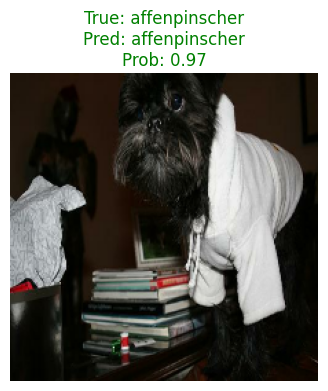

In [113]:
# Set target index
target_index = 42 # try changing this to another value and seeing how the model performs on other samples

# Get test image
test_image = test_ds_images[target_index]

# Get truth label (index of max in test label)
test_image_truth_label = class_names[tf.argmax(test_ds_labels[target_index])]

# Get prediction probabilities
test_image_pred_probs = test_preds[target_index]

# Get index of class with highest prediction probability
test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

# Plot the image
plt.figure(figsize=(5, 4))
plt.imshow(test_image.astype("uint8"))

# Create sample title with prediction probability value
title = f"""True: {test_image_truth_label}
Pred: {test_image_pred_class}
Prob: {np.max(test_image_pred_probs):.2f}"""

# Colour the title based on correctness of pred
plt.title(title,
          color="green" if test_image_truth_label == test_image_pred_class else "red")
plt.axis("off");

### Visualizing predictions from our best trained model



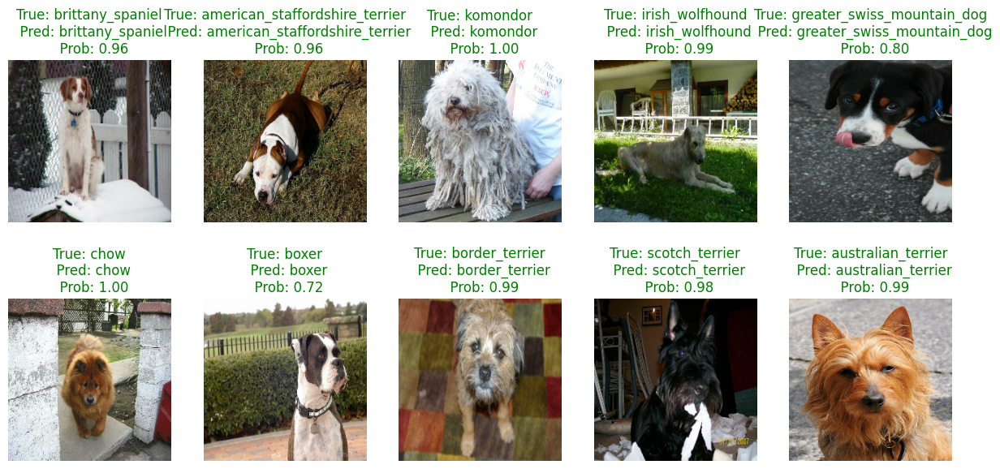

In [114]:
# Choose a random 10 indexes from the test data and compare the values
import random

random.seed(42) # try changing the random seed or commenting it out for different values
random_indexes = random.sample(range(len(test_ds_images)), 10)

# Create a plot with multiple subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

# Loop through the axes of the plot
for i, ax in enumerate(axes.flatten()):
  target_index = random_indexes[i] # get a random index (this is another reason we didn't shuffle the test set)

  # Get relevant target image, label, prediction and prediction probabilities
  test_image = test_ds_images[target_index]
  test_image_truth_label = class_names[tf.argmax(test_ds_labels[target_index])]
  test_image_pred_probs = test_preds[target_index]
  test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

  # Plot the image
  ax.imshow(test_image.astype("uint8"))

  # Create sample title
  title = f"""True: {test_image_truth_label}
  Pred: {test_image_pred_class}
  Prob: {np.max(test_image_pred_probs):.2f}"""

  # Colour the title based on correctness of pred
  ax.set_title(title,
               color="green" if test_image_truth_label == test_image_pred_class else "red")
  ax.axis("off")

### Finding the accruacy per class

Our model's overall accuracy is ~90%.

This is an outstanding result.




In [115]:
# Get argmax labels of test predictions and test ground truth
test_preds_labels = test_preds.argmax(axis=-1)
test_ds_labels_argmax = test_ds_labels.argmax(axis=-1)

# Get highest prediction probability of test predictions
test_pred_probs_max = tf.reduce_max(test_preds, axis=-1).numpy() # extract NumPy since pandas doesn't handle TensorFlow Tensors

# Create DataFram of test results
test_results_df = pd.DataFrame({"test_pred_label": test_preds_labels,
                                "test_pred_prob": test_pred_probs_max,
                                "test_pred_class_name": [class_names[test_pred_label] for test_pred_label in test_preds_labels],
                                "test_truth_label": test_ds_labels_argmax,
                                "test_truth_class_name": [class_names[test_truth_label] for test_truth_label in test_ds_labels_argmax]})

# Create a column whether or not the prediction matches the label
test_results_df["correct"] = test_results_df["test_pred_class_name"] == test_results_df["test_truth_class_name"]

test_results_df.head()

,test_pred_label,test_pred_prob,test_pred_class_name,test_truth_label,test_truth_class_name,correct
0,0,0.955536,affenpinscher,0,affenpinscher,True
1,0,0.629997,affenpinscher,0,affenpinscher,True
2,0,0.990437,affenpinscher,0,affenpinscher,True
3,44,0.822151,flat_coated_retriever,0,affenpinscher,False
4,0,0.982962,affenpinscher,0,affenpinscher,True


In [116]:
# Calculate accuracy per class
accuracy_per_class = test_results_df.groupby("test_truth_class_name")["correct"].mean()

# Create new DataFrame to sort classes by accuracy
accuracy_per_class_df = pd.DataFrame(accuracy_per_class).reset_index().sort_values("correct", ascending=False)
accuracy_per_class_df.head()

,test_truth_class_name,correct
10,bedlington_terrier,1.000000
62,keeshond,1.000000
30,chow,0.989583
2,african_hunting_dog,0.985507
36,dhole,0.980000


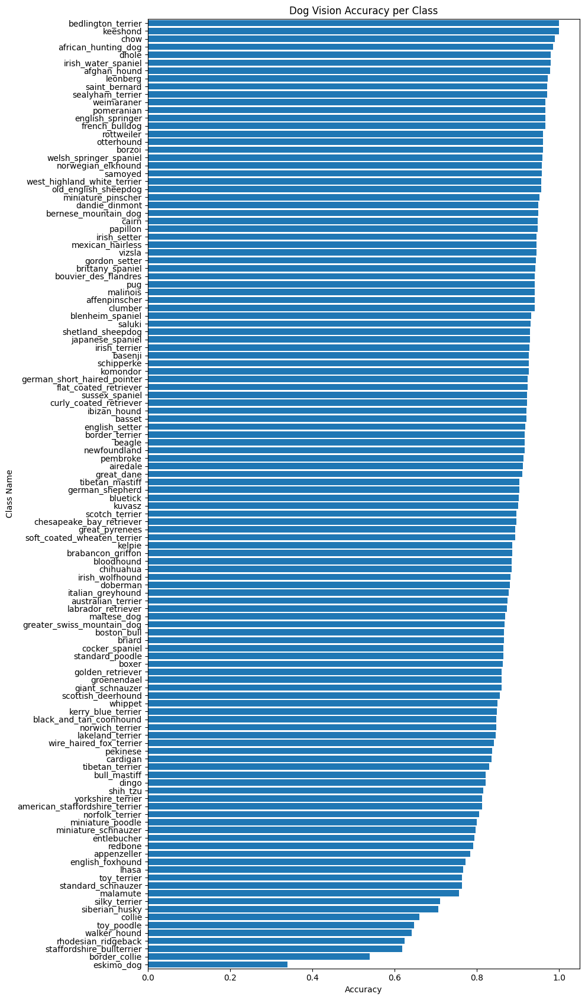

In [117]:
# Let's create a horizontal bar chart to replicate a similar plot to the original Stanford Dogs page
plt.figure(figsize=(10, 17))
plt.barh(y=accuracy_per_class_df["test_truth_class_name"],
         width=accuracy_per_class_df["correct"])
plt.xlabel("Accuracy")
plt.ylabel("Class Name")
plt.title("Dog Vision Accuracy per Class")
plt.ylim(-0.5, len(accuracy_per_class_df["test_truth_class_name"]) - 0.5)  # Adjust y-axis limits to reduce white space
plt.gca().invert_yaxis()  # This will display the first class at the top
plt.tight_layout()
plt.show()

In [118]:
# Inspecting our worst performing classes (note how only a couple of classes perform at ~55% accuracy or below)
accuracy_per_class_df.tail()

,test_truth_class_name,correct
113,walker_hound,0.641509
90,rhodesian_ridgeback,0.625000
104,staffordshire_bullterrier,0.618182
16,border_collie,0.540000
43,eskimo_dog,0.340000


### Finding the most wrong examples



In [119]:
# Get most wrong
top_100_most_wrong = test_results_df[test_results_df["correct"] == 0].sort_values("test_pred_prob", ascending=False)[:100]
top_100_most_wrong.head()

,test_pred_label,test_pred_prob,test_pred_class_name,test_truth_label,test_truth_class_name,correct
2727,75,0.998092,miniature_pinscher,38,doberman,False
5480,44,0.996205,flat_coated_retriever,78,newfoundland,False
6884,54,0.994865,groenendael,95,schipperke,False
1715,85,0.992122,pekinese,22,brabancon_griffon,False
7630,4,0.986461,american_staffordshire_terrier,104,staffordshire_bullterrier,False


In [120]:
# Get 10 random indexes of "most wrong" predictions
top_100_most_wrong.sample(n=10).index

Index([559, 3042, 7804, 8074, 7977, 8413, 5614, 5216, 2462, 342], dtype='int64')

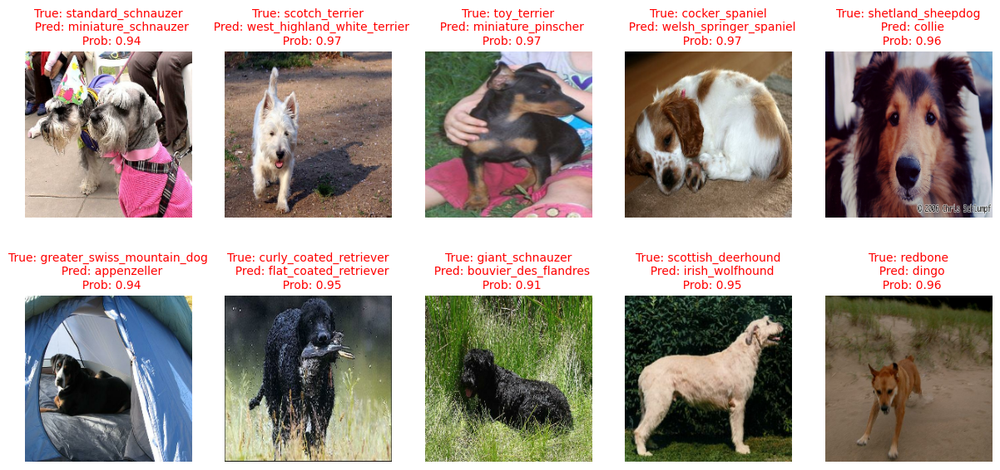

In [121]:
# Choose a random 10 indexes from the test data and compare the values
import random

random_most_wrong_indexes = top_100_most_wrong.sample(n=10).index

# Iterate through test results and plot them
# Note: This is why we don't shuffle the test data, so that it's in original order when we evaluate it.
fig, axes = plt.subplots(2, 5, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  target_index = random_most_wrong_indexes[i]

  # Get relevant target image, label, prediction and prediction probabilities
  test_image = test_ds_images[target_index]
  test_image_truth_label = class_names[tf.argmax(test_ds_labels[target_index])]
  test_image_pred_probs = test_preds[target_index]
  test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

  # Plot the image
  ax.imshow(test_image.astype("uint8"))

  # Create sample title
  title = f"""True: {test_image_truth_label}
  Pred: {test_image_pred_class}
  Prob: {np.max(test_image_pred_probs):.2f}"""

  # Colour the title based on correctness of pred
  ax.set_title(title,
               color="green" if test_image_truth_label == test_image_pred_class else "red",
               fontsize=10)
  ax.axis("off")

### Create a confusion matrix

A confusion matrix helps to visualize which classes a predicted compared to which classes it should've predicted (truth vs. predictions).


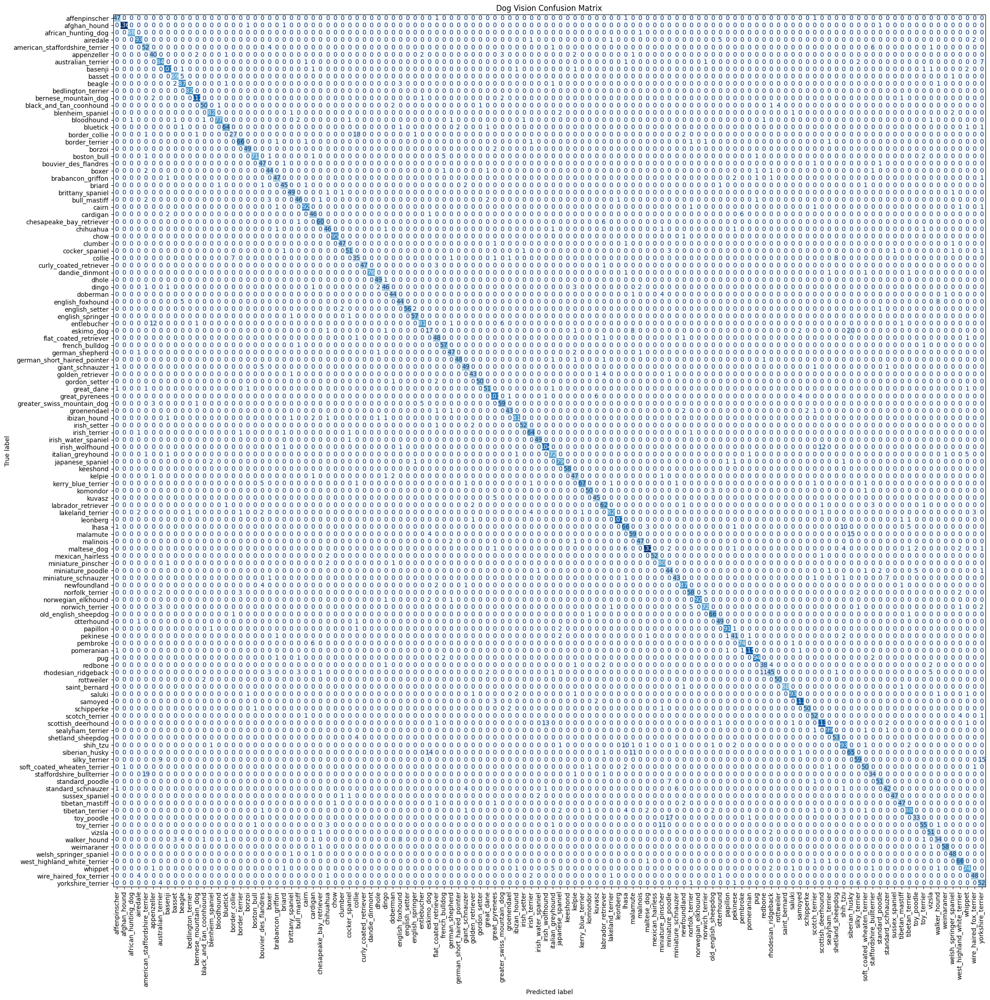

In [122]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Create a confusion matrix
confusion_matrix_dog_preds = confusion_matrix(y_true=test_ds_labels_argmax, # requires all labels to be in same format (e.g. not one-hot)
                                              y_pred=test_preds_labels)
# Create a confusion matrix plot
confusion_matrix_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_dog_preds,
                                                  display_labels=class_names)
fig, ax = plt.subplots(figsize=(25, 25))
ax.set_title("Dog Vision Confusion Matrix")
confusion_matrix_display.plot(xticks_rotation="vertical",
                              cmap="Blues",
                              colorbar=False,
                              ax=ax);

## 11. Save and load the best model



In [123]:
# Save the model to .keras
model_save_path = "dog_vision_model.keras"
model_1.save(filepath=model_save_path,
             save_format="keras")

Model saved!

And we can load it back in using the [`tf.keras.models.load_model()`](https://www.tensorflow.org/api_docs/python/tf/keras/saving/load_model) method.

In [124]:
# Load the model
loaded_model = tf.keras.models.load_model(filepath=model_save_path)

And now we can evaluate our `loaded_model` to make sure it performs well on the test dataset.

In [125]:
# Evaluate the loaded model
loaded_model_results = loaded_model.evaluate(test_ds)

269/269 [==============================] - 16s 48ms/step - loss: 0.3688 - accuracy: 0.8823


we check if the `loaded_model_results` are the same as the `model_1_results`?

In [126]:
assert model_1_results == loaded_model_results

Our trained model and loaded model results are the same!

We could now use our `dog_vision_model.keras` file in an application to predict a dog breed based on an image.

> **Note:** If you're using Google Colab, remember that after a period of time if you Google Colab instance gets disconnected, it will delete all local files. So if you want to keep your `dog_vision_model.keras` be sure to download it or copy it to Google Drive.


## 12. Make predictions on custom images with the best model

Well, let's make some predictions on custom images!

Specifically, let's try our best model on images of my dogs and an extra wildcard image.

We can download the photos from the [course GitHub](https://github.com/mrdbourke/zero-to-mastery-ml/raw/master/images/dog-photos.zip).

In [127]:
# Download a set of custom images from GitHub and unzip them
!wget -nc https://github.com/mrdbourke/zero-to-mastery-ml/raw/master/images/dog-photos.zip
!unzip dog-photos.zip

--2025-01-06 16:54:40--  https://github.com/mrdbourke/zero-to-mastery-ml/raw/master/images/dog-photos.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/mrdbourke/zero-to-mastery-ml/master/images/dog-photos.zip [following]
--2025-01-06 16:54:40--  https://raw.githubusercontent.com/mrdbourke/zero-to-mastery-ml/master/images/dog-photos.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1091355 (1.0M) [application/zip]
Saving to: ‘dog-photos.zip’

dog-photos.zip      100%[===================>]   1.04M  --.-KB/s    in 0.005s  

2025-01-06 16:54:41 (214 MB/s) - ‘dog-photos.zip’ saved [1091355/1

Wonderful! We can inspect our images in the file browser and see that they're under the name `dog-photo-*.jpeg`.

How about we iterate through them and visualize each one?

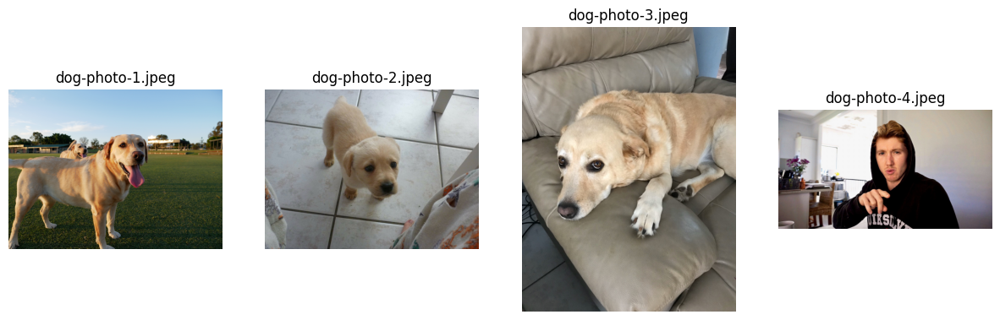

In [128]:
# Create list of paths for custom dog images
custom_image_paths = ["dog-photo-1.jpeg",
                      "dog-photo-2.jpeg",
                      "dog-photo-3.jpeg",
                      "dog-photo-4.jpeg"]

# Iterate through list of dog images and plot each one
fig, axes = plt.subplots(1, 4, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  ax.imshow(plt.imread(custom_image_paths[i]))
  ax.axis("off")
  ax.set_title(custom_image_paths[i])

What?

The first three photos look well and good but we can see `dog-photo-4.jpeg` is a photo of me in a black hoodie pulling a [blue steel](https://www.google.com/search?q=blue+steel) face.

We'll see why this is later.

For now, let's use our `loaded_model` to try and make a prediction on the first dog image (`dog-photo-1.jpeg`)!

We can do so with the `predict()` method.

In [129]:
# Load the image (into PIL format)
custom_image = tf.keras.utils.load_img(
  path="dog-photo-1.jpeg",
  color_mode="rgb",
  target_size=IMG_SIZE, # (224, 224) or (img_height, img_width)
)

type(custom_image), custom_image

(PIL.Image.Image, <PIL.Image.Image image mode=RGB size=224x224>)

In [130]:
# Turn the image into a tensor
custom_image_tensor = tf.keras.utils.img_to_array(custom_image)
custom_image_tensor.shape

(224, 224, 3)

Nice! We've got an image tensor of shape `(224, 224, 3)`.

How about we make a prediction on it?

In [131]:
#  1: Add batch dimension to custom_image_tensor
print(f"Shape of custom image tensor: {np.array([custom_image_tensor]).shape}")
print(f"Shape of custom image tensor: {tf.expand_dims(custom_image_tensor, axis=0).shape}")

Shape of custom image tensor: (1, 224, 224, 3)
Shape of custom image tensor: (1, 224, 224, 3)


We've got a custom image tensor of shape `(1, 224, 224, 3)` (`(batch_size, img_height, img_width, colour_channels)`).

Let's try and predict!

In [132]:
# Get prediction probabilities from our mdoel
pred_probs = loaded_model.predict(tf.expand_dims(custom_image_tensor, axis=0))
pred_probs

1/1 [==============================] - 2s 2s/step


array([[1.0844365e-06, 1.2754494e-06, 1.9182494e-06, 1.7532408e-05,
        1.0060207e-03, 5.9866350e-05, 3.1807288e-06, 5.6650380e-05,
        3.9649453e-06, 2.1748021e-04, 2.6807165e-06, 1.5807136e-06,
        4.5541592e-04, 1.8854309e-06, 6.5200869e-04, 3.0888761e-05,
        2.2085183e-05, 4.8561491e-05, 3.2491422e-05, 4.7023818e-06,
        1.1549030e-06, 5.3698048e-05, 1.8940047e-05, 1.7361992e-05,
        5.9259186e-05, 7.6373615e-03, 1.7518718e-05, 1.0097684e-04,
        1.4060050e-03, 5.2927283e-04, 1.3060209e-04, 3.2950353e-05,
        4.7394191e-05, 3.2867372e-04, 1.1054604e-04, 5.6469389e-06,
        5.5724545e-06, 1.6857175e-03, 5.9159993e-06, 2.0977252e-04,
        4.3772267e-05, 5.0415787e-07, 5.6976343e-05, 1.0362916e-03,
        2.6678879e-04, 1.6647059e-04, 4.7217411e-04, 3.2955377e-05,
        8.3254827e-06, 4.5611270e-02, 1.1897650e-06, 3.1550659e-04,
        2.2431510e-03, 2.3041859e-04, 6.2168505e-07, 1.7123786e-05,
        6.4541869e-06, 4.2996391e-05, 4.5518450e

In [133]:
# Get the predicted class label
pred_label = tf.argmax(pred_probs, axis=-1).numpy()[0]

# Get the predicted class name
pred_class_name = class_names[pred_label]

print(f"Predicted class label: {pred_label}")
print(f"Predicted class name: {pred_class_name}")

Predicted class label: 67
Predicted class name: labrador_retriever


In [134]:
def pred_on_custom_image(image_path: str,  # Path to the image file
                         model,  # Trained TensorFlow model for prediction
                         target_size: tuple[int, int] = (224, 224),  # Desired size of the image for input to the model
                         class_names: list = None,  # List of class names (optional for plotting)
                         plot: bool = True): # Whether to plot the image and predicted class
  """
  Loads an image, preprocesses it, makes a prediction using a provided model,
  and optionally plots the image with the predicted class.

  Args:
      image_path (str): Path to the image file.
      model: Trained TensorFlow model for prediction.
      target_size (int, optional): Desired size of the image for input to the model. Defaults to 224.
      class_names (list, optional): List of class names for plotting. Defaults to None.
      plot (bool, optional): Whether to plot the image and predicted class. Defaults to True.

  Returns:
     str: The predicted class.
  """

  # Prepare and load image
  custom_image = tf.keras.utils.load_img(
    path=image_path,
    color_mode="rgb",
    target_size=target_size,
  )

  # Turn the image into a tensor
  custom_image_tensor = tf.keras.utils.img_to_array(custom_image)

  # Add a batch dimension to the target tensor (e.g. (224, 224, 3) -> (1, 224, 224, 3))
  custom_image_tensor = tf.expand_dims(custom_image_tensor, axis=0)

  # Make a prediction with the target model
  pred_probs = model.predict(custom_image_tensor)

  # pred_probs = tf.keras.activations.softmax(tf.constant(pred_probs))
  pred_class = class_names[tf.argmax(pred_probs, axis=-1).numpy()[0]]

  # Plot if we want
  if not plot:
    return pred_class, pred_probs
  else:
    plt.figure(figsize=(5, 3))
    plt.imshow(plt.imread(image_path))
    plt.title(f"pred: {pred_class}\nprob: {tf.reduce_max(pred_probs):.3f}")
    plt.axis("off")

1/1 [==============================] - 0s 30ms/step


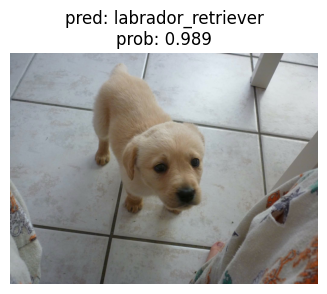

In [135]:
# Make prediction on custom dog photo 2
pred_on_custom_image(image_path="dog-photo-2.jpeg",
                     model=loaded_model,
                     class_names=class_names)

1/1 [==============================] - 0s 28ms/step


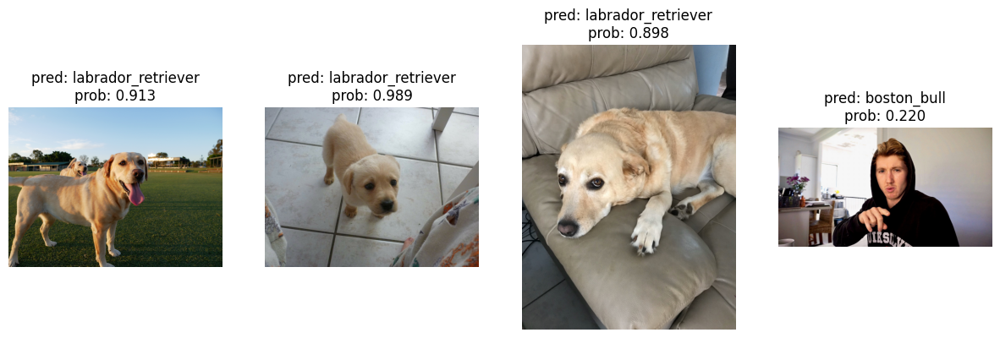

In [136]:
# Predict on multiple images
fig, axes = plt.subplots(1, 4, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
  image_path = custom_image_paths[i]
  pred_class, pred_probs = pred_on_custom_image(image_path=image_path,
                                                model=loaded_model,
                                                class_names=class_names,
                                                plot=False)
  ax.imshow(plt.imread(image_path))
  ax.set_title(f"pred: {pred_class}\nprob: {tf.reduce_max(pred_probs):.3f}")
  ax.axis("off");

### Extension example: data augmentation

Data augmentation is a regularization technique to help prevent overfitting.

It's designed to alter training images to artifically increase the diversity of the training dataset and hopefully help to generalize better to test images as well as real-life images.

For example, we want our models to be able to identify the same breed of dog in an image regardless if the dog is facing left or right.

So one simple data augmentation technique is to randomly flip the image horizontally so the model learns to recognize the same dog from different points of view.

You can repeat this for many different types of image modifications such as rotation, zone, colour alterations and more.

The following code is a brief example of how to incorporate a data augmentation layer into a model (note that in practice data augmentation is only applied during training time and not during testing/prediction time, this is set automatically within layers aimed at data augmentation).

For more, see the [TensorFlow guide on data augmentation](https://www.tensorflow.org/tutorials/images/data_augmentation).

In [137]:
from tensorflow.keras import layers

# Note: Could functionize all of this

# Setup hyperparameters
img_size = 224
num_classes = 120

# Create data augmentation layer
data_augmentation_layer = tf.keras.Sequential(
    [
        layers.RandomFlip("horizontal"), # randomly flip image across horizontal axis
        layers.RandomRotation(factor=0.2), # randomly rotate image
        layers.RandomZoom(height_factor=0.2, width_factor=0.2) # randomly zoom into image
        # More augmentation can go here
    ],
    name="data_augmentation"
)

# Setup base model
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False,
    weights='imagenet',
    input_shape=(img_size, img_size, 3),
    include_preprocessing=True
)

# Freeze the base model
base_model.trainable = False

# Create new model
inputs = tf.keras.Input(shape=(224, 224, 3))

# Create data augmentation
x = data_augmentation_layer(inputs)

# Craft model
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(num_classes,
                                name="output_layer",
                                activation="softmax")(x) # Note: If you have "softmax" activation, use from_logits=False in loss function
model_2 = tf.keras.Model(inputs, outputs, name="model_2")

# Uncomment for full model summary with augmentation layers
# model_2.summary()

### Extension Example: Gradio App Demo

This is a modified version of the [Gradio Image Classification Tutorial with TensorFlow and Keras](https://www.gradio.app/guides/image-classification-in-tensorflow).



First we'll [install Gradio](https://www.gradio.app/guides/quickstart).

In [138]:
!pip install -q gradio
import gradio as gr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 320.4/320.4 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 108.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.0 MB/s eta 0:00:00


In [139]:
import tensorflow as tf

# Download saved model and labels from Hugging Face
!wget -q https://huggingface.co/spaces/mrdbourke/dog_vision/resolve/main/dog_vision_model_demo.keras
!wget -q https://huggingface.co/spaces/mrdbourke/dog_vision/resolve/main/stanford_dogs_class_names.txt

# Load model
model_save_path = "dog_vision_model_demo.keras"
loaded_model_for_demo = tf.keras.models.load_model(model_save_path)

# Load labels
with open("stanford_dogs_class_names.txt", "r") as f:
  class_names = [line.strip() for line in f.readlines()]

The prediction function should take in an image and return a dictionary of classes and their prediction probabilities.

In [140]:
# Create prediction function
def pred_on_custom_image(image, # input image (preprocessed by Gradio's Image input to be numpy.array)
                         model: tf.keras.Model = loaded_model_for_demo,  # Trained TensorFlow model for prediction
                         target_size: int = 224,  # Desired size of the image for input to the model
                         class_names: list = class_names): # List of class names
  """
  Loads an image, preprocesses it, makes a prediction using a provided model,
  and returns a dictionary of prediction probabilities per class name.

  Args:
      image: Input image.
      model: Trained TensorFlow model for prediction.
      target_size (int, optional): Desired size of the image for input to the model. Defaults to 224.
      class_names (list, optional): List of class names for plotting. Defaults to None.

  Returns:
     Dict[str: float]: A dictionary of string class names and their respective prediction probability.
  """

  # Note: gradio.inputs.Image handles opening the image
  # # Prepare and load image
  # custom_image = tf.keras.utils.load_img(
  #   path=image_path,
  #   color_mode="rgb",
  #   target_size=target_size,
  # )

  # Create resizing layer to resize the image
  resize = tf.keras.layers.Resizing(height=target_size,
                                    width=target_size)

  # Turn the image into a tensor and resize it
  custom_image_tensor = resize(tf.keras.utils.img_to_array(image))

  # Add a batch dimension to the target tensor (e.g. (224, 224, 3) -> (1, 224, 224, 3))
  custom_image_tensor = tf.expand_dims(custom_image_tensor, axis=0)

  # Make a prediction with the target model
  pred_probs = model.predict(custom_image_tensor)[0]

  # Predictions get returned as a dictionary of {label: pred_prob}
  pred_probs_dict = {class_names[i]: float(pred_probs[i]) for i in range(len(class_names))}

  return pred_probs_dict

interface_title = "Dog Vision 🐶👁️"
interface_description = "Identify different dogs in images with deep learning. Model trained with TensorFlow/Keras."
interface = gr.Interface(fn=pred_on_custom_image,
                         inputs=gr.Image(),
                         outputs=gr.Label(num_top_classes=3),
                         examples=["dog-photo-1.jpeg",
                                    "dog-photo-2.jpeg",
                                    "dog-photo-3.jpeg",
                                    "dog-photo-4.jpeg"],
                         title=interface_title,
                         description=interface_description)

# Uncomment to launch the interface directly in a notebook
# interface.launch(debug=True)

Save the following code to an `app.py` file for running on Hugging Face spaces.

Finally, you can see the [running demo on Hugging Face](https://huggingface.co/spaces/mrdbourke/dog_vision).

Try it out with your own images of dogs and see Dog Vision 🐶👁️ come to life!


In [141]:
from IPython.display import HTML

# Embed the Hugging Face Space as an iframe
html_string = """
<iframe src="https://mrdbourke-dog-vision.hf.space" frameborder="0" width="850" height="850"></iframe>
"""

display(HTML(html_string))